# Asymmetric reweighting bands with ten positions and a 15% cap

Variant based on `33-backtest-floor-rank-weighting-10-positions-15pct-cap.ipynb`.

This experiment preserves NB33's 5% floor-plus-linear-rank allocator, stable membership, holding periods and exit rules. It changes only the target-weight dead band: additions smaller than 1.0% of equity are suppressed, while reductions smaller than 2.5% are suppressed. Full exits remain unsuppressed. The purpose is to let strong incumbents compound with modest top-ups while avoiding small, repeated trims.

## Key new insights and what did we learn from this experiment

Asymmetric bands materially improve the reported risk profile but do not improve the portfolio. The 1.0% addition band admits more top-ups, while the 2.5% reduction band only applies outside cycles that require CCTP liquidity; the latter exception is necessary because otherwise withheld primary-chain trims leave satellite purchases unfunded. This changes the capital path enough to add 1,124 trades versus NB33, leave more cash in Fluid and reduce final equity by $517.17.

## Summary of results

The backtest finishes at $113,069.24 from $100,000: 13.07% total return and 9.56% CAGR, versus NB33's $113,586.41 and 9.93%. It executes 2,682 trades, comprising 2,131 vault trades and 551 successful CCTP bridges, with $7.52 million of vault turnover. HYPE++ and Plutus remain the largest contributors at $2,928.62 and $1,975.74 respectively, but their combined contribution is $208.79 below NB33. The final Fluid queue is $3,212.85, raw USDC reserve is $7,148.47 and a $2,301.84 Hub Capital deposit remains pending; Plutus is separately redemption-locked at $13,408.61.

## Robustness of results

The apparent risk improvement is not a sufficient benefit: Sharpe rises from 6.09 to 6.70 and maximum drawdown improves from -0.77% to -0.32%, but kurtosis rises from 102.45 to 128.51 and the best day remains a concentrated 1.14%. Positions rise from 85 to 96, positions held seven days or less rise from 19 to 36, and membership changes rise from 32 to 34. The CCTP-liquidity exception makes this not a pure global 2.5% trim band: it deliberately preserves reductions on cross-chain funding cycles. The experiment therefore shows that asymmetric reweighting needs a cash-aware implementation in the execution planner, rather than a signal-level suppression rule.


## Notebook setup

Imports, Trading Strategy client and charting setup.


In [1]:
import datetime
import logging
import os

import numpy as np
import pandas as pd
import plotly.express as px
from IPython.display import display
from dotenv import load_dotenv
from eth_defi.token import USDC_NATIVE_TOKEN
from plotly.graph_objects import Figure
from tradingstrategy.chain import ChainId
from tradingstrategy.client import Client
from tradingstrategy.timebucket import TimeBucket
from tradingstrategy.utils.token_filter import filter_for_selected_pairs

from tradeexecutor.analysis.vault import (
    BLACKLISTED_VAULT_DIAGNOSTIC_FLAG,
    WHITELISTED_VAULT_DIAGNOSTIC_FLAG,
    mark_whitelisted_vaults_ignored,
    render_blacklisted_vaults,
    render_whitelisted_vaults,
)
from tradeexecutor.backtest.backtest_runner import run_backtest_inline
from tradeexecutor.curator import is_quarantined
from tradeexecutor.ethereum.vault.checks import check_stale_vault_data
from tradeexecutor.exchange_account.allocation import (
    calculate_portfolio_target_value,
    get_redeemable_portfolio_capital,
)
from tradeexecutor.state.identifier import TradingPairIdentifier
from tradeexecutor.state.trade import TradeExecution
from tradeexecutor.state.types import USDollarAmount
from tradeexecutor.strategy.alpha_model import AlphaModel
from tradeexecutor.strategy.chart.definition import ChartInput, ChartKind, ChartRegistry
from tradeexecutor.strategy.chart.standard.alpha_model import (
    alpha_model_diagnostics,
    missed_vault_deposit_redemption_events,
    missed_vault_deposit_redemption_timeline,
)
from tradeexecutor.strategy.chart.standard.equity_curve import (
    equity_curve as equity_curve_chart,
    equity_curve_with_drawdown,
)
from tradeexecutor.strategy.chart.standard.interest import vault_statistics
from tradeexecutor.strategy.chart.standard.performance_metrics import performance_metrics
from tradeexecutor.strategy.chart.standard.position import positions_at_end
from tradeexecutor.strategy.chart.standard.profit_breakdown import trading_pair_breakdown
from tradeexecutor.strategy.chart.standard.thinking import last_messages
from tradeexecutor.strategy.chart.standard.trading_metrics import trading_metrics
from tradeexecutor.strategy.chart.standard.trading_universe import (
    available_trading_pairs,
    ignored_vault_data,
    inclusion_criteria_check,
)
from tradeexecutor.strategy.chart.standard.vault import (
    all_vault_positions,
    pending_trigger_queue,
    pending_vault_settlements,
    vault_settlement_observations,
    phase_aware_queue_duration,
    phase_aware_queue_duration_summary,
)
from tradeexecutor.strategy.chart.standard.weight import (
    equity_curve_by_asset,
    equity_curve_by_asset_with_legend,
    equity_curve_by_chain,
    equity_curve_by_liquidity_state,
    weight_allocation_statistics,
)
from tradeexecutor.strategy.cycle import CycleDuration
from tradeexecutor.strategy.default_routing_options import TradeRouting
from tradeexecutor.strategy.execution_context import ExecutionContext, ExecutionMode, notebook_execution_context
from tradeexecutor.strategy.pandas_trader.indicator import (
    IndicatorDependencyResolver,
    IndicatorSource,
    calculate_and_load_indicators_inline,
)
from tradeexecutor.strategy.pandas_trader.indicator_decorator import IndicatorRegistry
from tradeexecutor.strategy.pandas_trader.strategy_input import StrategyInput
from tradeexecutor.strategy.pandas_trader.trading_universe_input import CreateTradingUniverseInput
from tradeexecutor.strategy.parameters import StrategyParameters
from tradeexecutor.strategy.reserve_currency import ReserveCurrency
from tradeexecutor.strategy.tag import StrategyTag
from tradeexecutor.strategy.trading_strategy_universe import (
    TradingStrategyUniverse,
    load_partial_data,
    load_vault_universe_with_metadata,
)
from tradeexecutor.strategy.chart.renderer import ChartBacktestRenderingSetup
from tradeexecutor.strategy.vault_fee_data import mark_missing_fee_vaults_ignored
from tradeexecutor.strategy.tvl_size_risk import USDTVLSizeRiskModel
from tradeexecutor.strategy.universe_model import UniverseOptions
from tradeexecutor.utils.dedent import dedent_any
from tradeexecutor.utils.notebook import OutputMode, display_head_and_tail, setup_charting_and_output
from tradeexecutor.visual.equity_curve import calculate_equity_curve, calculate_returns

from tradeexecutor.backtest.vault_windows import VaultWindowSchedule
from tradeexecutor.strategy.pandas_trader.yield_manager import (
    YieldDecisionInput,
    YieldManager,
    YieldRuleset,
    YieldWeightingRule,
)
from tradeexecutor.strategy.phase_aware import PhaseAwareAlphaModel, queue_vault_pair_ids

load_dotenv(override=True)
setup_charting_and_output(OutputMode.static, image_format="png", width=1500, height=900)

api_key = os.environ.get("TRADING_STRATEGY_API_KEY")
client = Client.create_jupyter_client(api_key=api_key)
logger = logging.getLogger("strategy")

trading_strategy_engine_version = "0.5"

Started Trading Strategy in Jupyter notebook environment, configuration is stored in /Users/moo/.tradingstrategy


## Parameters

Strategy parameters and the phase-aware queue venue configuration.


In [2]:
class Parameters:
    id = "xchain-asymmetric-reweighting-no-trade-bands-10-positions-15pct-cap-through-2026-08-05"
    candle_time_bucket = TimeBucket.d1
    cycle_duration = CycleDuration.cycle_1d
    chain_id = ChainId.cross_chain
    primary_chain_id = ChainId.arbitrum
    preferred_stablecoin = USDC_NATIVE_TOKEN[ChainId.arbitrum].lower()
    auto_generate_cctp_bridges = True

    data_history_start = datetime.datetime(2024, 6, 1)
    backtest_start = datetime.datetime(2025, 4, 1)
    backtest_end = datetime.datetime(2026, 8, 6)
    initial_cash = 100_000

    max_assets_in_portfolio = 10
    allocation_pct = 0.95
    cross_chain_cash_buffer_usd = 1_000
    rebalance_execution_cash_buffer_usd = 1.0
    max_concentration_pct = 0.15
    minimum_target_weight_pct = 0.05
    per_position_cap_of_pool_pct = 0.2
    min_portfolio_weight_pct = 0.005
    selection_refresh_weekday = 0  # Monday
    entry_rank = 10
    retention_rank = 12
    min_hold_days_sync = 28
    min_hold_days_async = 60
    exit_returns_net = 0.01
    addition_target_weight_no_trade_band_pct = 0.01
    reduction_target_weight_no_trade_band_pct = 0.025

    # Phase-aware queue venue (YieldManager) settings.
    # position_allocation is tied to allocation_pct (invariant 5): the 5% reserve is kept as
    # cash, the idle excess above it is swept into the queue venue to earn yield.
    use_managed_yield = True
    directional_trade_yield_buffer_pct = 0.02
    yield_flow_dust_threshold = 5.0

    absolute_min_vault_deposit_usd = 5.0
    individual_rebalance_min_threshold_usd = 50.0
    sell_rebalance_min_threshold_usd = 10.0

    min_tvl_usd = 50_000
    min_age = 0.0
    weight_signal = "3m_cagr_capped_waterfall"
    score_lookback_days = 90
    min_returns_net = 0.01
    age_ramp_period = 0.75

    required_history_period = backtest_start - data_history_start
    routing = TradeRouting.default
    slippage_tolerance_pct = 0.0060
    assummed_liquidity_when_data_missings_usd = 0.01


parameters = StrategyParameters.from_class(Parameters)


# --- Phase-aware queue venue + window-gated vault configuration ---------------

# Arbitrum-primary native-USDC Fluid USD Coin is the yield-bearing queue venue. It must be
# synchronous (instant liquidity) and on the primary chain, so a same-cycle venue release
# can fund a satellite-chain deposit via CCTP.
QUEUE_VENUE_ADDRESS = "0x1a996cb54bb95462040408c06122d45d6cdb6096"

# Window-gated directional vaults whose deposit/redemption windows we model as closed most of the
# time (D2 HYPE++). HYPE++ must pass the same return and buffered-rank selection rules as
# every other vault; this list only controls the park -> deposit-on-open path.
WINDOW_GATED_VAULTS = [
    (ChainId.arbitrum, "0x75288264fdfea8ce68e6d852696ab1ce2f3e5004"),  # HYPE++ (d2-finance), Arbitrum
]

# Synthetic deposit/redemption window: open a short spell at the start of every epoch. Frequent
# windows keep the park -> promote demonstration deterministic even for short-history vaults.
WINDOW_CADENCE = datetime.timedelta(days=14)
WINDOW_OPEN_DURATION = datetime.timedelta(days=2)
# Anchor so backtest_start falls in the CLOSED part of the first epoch (phase == open_duration is
# closed): this forces the window-gated vaults to defer (park) their first deposit and then promote
# when the window next opens, exercising the full park -> deposit-on-open path rather than depositing
# directly on an open start.
WINDOW_ANCHOR = Parameters.backtest_start - WINDOW_OPEN_DURATION


def get_window_gated_pairs(strategy_universe):
    """Resolve the window-gated vault pairs that are present in the universe."""
    pairs = []
    for _chain_id, address in WINDOW_GATED_VAULTS:
        try:
            pair = strategy_universe.get_pair_by_smart_contract(address)
        except Exception:
            pair = None
        if pair is not None:
            pairs.append(pair)
    return pairs


def create_yield_rules(parameters, strategy_universe) -> YieldRuleset:
    """Single-venue YieldRuleset: sweep idle cash into the hub-chain synchronous USDC vault.

    The last (only) slot has max_concentration == 1.0, the instant-liquidity fallback that absorbs
    all swept cash (YieldRuleset.validate() enforces this).
    """
    venue = strategy_universe.get_pair_by_smart_contract(QUEUE_VENUE_ADDRESS)
    assert venue is not None, f"Queue venue {QUEUE_VENUE_ADDRESS} not found in universe"
    return YieldRuleset(
        position_allocation=parameters.allocation_pct,
        buffer_pct=parameters.directional_trade_yield_buffer_pct,
        cash_change_tolerance_usd=parameters.yield_flow_dust_threshold,
        weights=[YieldWeightingRule(pair=venue, max_concentration=1.0)],
    )


def build_vault_window_overrides(strategy_universe) -> dict:
    """Map window-gated vault internal ids to a synthetic VaultWindowSchedule.

    Passed on the universe as ``vault_window_overrides``; BacktestPricing consults it BEFORE the
    real vault_state, so a stale / always-open availability frame cannot stop the schedule firing.
    """
    schedule = VaultWindowSchedule(
        cadence=WINDOW_CADENCE,
        open_duration=WINDOW_OPEN_DURATION,
        anchor=WINDOW_ANCHOR,
    )
    return {pair.internal_id: schedule for pair in get_window_gated_pairs(strategy_universe)}


## Trading universe

The 6 August 2026 metadata snapshot selects native-USDC vaults on the supported CCTP chains. Threshold protocols require current TVL above $50,000; requested protocol and curator groups retain all depositable native-USDC vaults except cSigma, which is explicitly excluded in this variant. Morpho vaults with red or yellow display flags are excluded.

Deposit-whitelisted vaults and vaults with incomplete fee metadata are retained only for diagnostics and marked ignored before allocation.


In [3]:
LENDING_RESERVES = None

SUPPORTING_PAIRS = [
    (ChainId.ethereum, "uniswap-v3", "WETH", "USDC", 0.0005),
    (ChainId.ethereum, "uniswap-v3", "WBTC", "USDC", 0.003),
    (ChainId.arbitrum, "uniswap-v3", "WETH", "USDC", 0.0005),
    (ChainId.base, "uniswap-v3", "WETH", "USDC", 0.0005),
]

BENCHMARK_PAIRS = SUPPORTING_PAIRS

SOURCE_VAULTS = [
    # Generated from Trading Strategy vault metadata on 2026-08-06.
    # Every entry accepts its chain-native USDC denomination. Explicit subvaults,
    # legacy Yearn Compounders, cSigma vaults, and vaults with explicit entry or exit fees
    # are excluded. Incomplete fee metadata and deposit-whitelisted vaults remain for
    # diagnostics only and are marked ignored after universe construction.
    # Arbitrum
    # AaveV3 USDC Lender (yearn; curator=none; TVL=$39; flags=none; all native-USDC yearn)
    (ChainId.arbitrum, "0xd89ee1e95f7728f6964cf321e2648ccd29a881f1"),
    # Angmar Capital (lagoon-finance; curator=none; TVL=$2,651,813; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.arbitrum, "0x1723cb57af58efb35a013870c90fcc3d60174a4e"),
    # Arbitrum USDC Mix Yield Token (morpho; curator=none; TVL=$31,693; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.arbitrum, "0xeba62b842081cef5a8184318dc5c4e4aaca9f651"),
    # Blend USDC (morpho; curator=none; TVL=$7,694; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.arbitrum, "0x9ce8a73296704d4689586347ef6e2087c2128f45"),
    # Blend USDC Reserve (morpho; curator=none; TVL=$193; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.arbitrum, "0xa47c5203d22ae173788a9d9be0f2beecc97f4df9"),
    # Fluid USD Coin (fluid; curator=none; TVL=$36,988,619; flags=none; phase-aware queue venue)
    (ChainId.arbitrum, "0x1a996cb54bb95462040408c06122d45d6cdb6096"),
    # Gauntlet USDC Balanced (morpho; curator=gauntlet; TVL=$387,106; flags=none; morpho without red/yellow flags)
    (ChainId.arbitrum, "0x55a2b207b0074e13adcb858950a81b7a04775e0f"),
    # Gauntlet USDC Core (morpho; curator=gauntlet; TVL=$643,484; flags=none; morpho without red/yellow flags)
    (ChainId.arbitrum, "0x7e97fa6893871a2751b5fe961978dccb2c201e65"),
    # Gauntlet USDC Prime (morpho; curator=gauntlet; TVL=$301,774; flags=none; morpho without red/yellow flags)
    (ChainId.arbitrum, "0x610d151ae40662ae148cdbaae1ea5904b6afae78"),
    # Gauntlet USDC Prime (morpho; curator=gauntlet; TVL=$501,169; flags=none; morpho without red/yellow flags)
    (ChainId.arbitrum, "0x7c574174da4b2be3f705c6244b4bfa0815a8b3ed"),
    # gTrade (Gains Network USDC) (gains-network; curator=gains-network; TVL=$6,183,645; flags=none; gains-network TVL >= $50k)
    (ChainId.arbitrum, "0xd3443ee1e91af28e5fb858fbd0d72a63ba8046e0"),
    # HYPE++ (d2-finance; curator=d2-finance; TVL=$11,691,130; flags=none; Arbitrum D2 HYPE++ phase-aware directional vault)
    (ChainId.arbitrum, "0x75288264fdfea8ce68e6d852696ab1ce2f3e5004"),
    # Hyperithm USDC (morpho; curator=hyperithm; TVL=$475,720; flags=none; morpho without red/yellow flags)
    (ChainId.arbitrum, "0x4b6f1c9e5d470b97181786b26da0d0945a7cf027"),
    # IPOR USDC Prime (ipor-fusion; curator=ipor; TVL=$235,801; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.arbitrum, "0xd855296f9868ff659f3f359c90b7d005ec049228"),
    # kpk USDC Yield (morpho; curator=kpk; TVL=$587,366; flags=none; morpho without red/yellow flags)
    (ChainId.arbitrum, "0x5837e4189819637853a357af36650902347f5e73"),
    # MUV001 - Flagship USDC (yearn; curator=none; TVL=$32; flags=none; all native-USDC yearn)
    (ChainId.arbitrum, "0xe6dbfb035b44e94d07f7b3e4f6bfbf1c6e68e3d0"),
    # Plutus Dolomite vault (plutus; curator=none; TVL=$1; flags=none; all native-USDC plutus)
    (ChainId.arbitrum, "0xf84eaa0685626f84fe17bc6c3c9eb2ac8a90d3c1"),
    # Plutus Hedge Token (plutus; curator=none; TVL=$244,218; flags=none; all native-USDC plutus)
    (ChainId.arbitrum, "0x58bfc95a864e18e8f3041d2fcd3418f48393fe6a"),
    # PT sUSDai Feb 18 Morpho Looper (yearn; curator=none; TVL=$0; flags=none; all native-USDC yearn)
    (ChainId.arbitrum, "0x844cb3908172c9fde0a42ca6e4a13ca09a2b44bd"),
    # RizVaultUSDC (yearn; curator=none; TVL=$50,607; flags=none; all native-USDC yearn)
    (ChainId.arbitrum, "0x2e7aa06a0f0816de4b1a32a12b0ac4eb584bff2a"),
    # Sandbox (lagoon-finance; curator=none; TVL=$435,541; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.arbitrum, "0x018282d5b510f00dcacb8f4a81c3901d2fc9da51"),
    # Steakhouse High Yield (morpho; curator=steakhouse-financial; TVL=$4,092,821; flags=none; morpho without red/yellow flags)
    (ChainId.arbitrum, "0xbeeff1d5de8f79ff37a151681100b039661da518"),
    # Steakhouse High Yield Turbo (morpho; curator=steakhouse-financial; TVL=$15,190; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.arbitrum, "0xbeefff13dd098de415e07f033dae65205b31a894"),
    # syrupUSDC/USDC Morpho Looper (morpho; curator=none; TVL=$35; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.arbitrum, "0xbcf08997c34183d1b7b0f99e13aceacfba88e453"),
    # Teller USDC (yearn; curator=none; TVL=$50,691; flags=none; all native-USDC yearn)
    (ChainId.arbitrum, "0xbe7d1b3cf19eb05ac557be14af24e093fadfd7c6"),
    # Tokemak arbUSD (auto-finance; curator=none; TVL=$734,475; flags=none; all native-USDC auto-finance)
    (ChainId.arbitrum, "0xf63b7f49b4f5dc5d0e7e583cfd79dc64e646320c"),
    # Trust Wallet Fluid USDC (fluid; curator=trust-wallet; TVL=$242,825; flags=none; fluid TVL >= $50k)
    (ChainId.arbitrum, "0x6db146db8dcf2f96948c3982f0770871246ae810"),
    # USDC CompoundV3 Lender (yearn; curator=none; TVL=$22,989; flags=none; all native-USDC yearn)
    (ChainId.arbitrum, "0xcacc53bacce744ac7b5c1ec7eb7e3ab01330733b"),
    # USDC-A yVault (yearn; curator=none; TVL=$23,802; flags=none; all native-USDC yearn)
    (ChainId.arbitrum, "0x6faf8b7ffee3306efcfc2ba9fec912b4d49834c1"),
    # VaultMorpho (morpho; curator=none; TVL=$0; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.arbitrum, "0x46ce9aa8167fa3e154395c25d19db25ddfcfeab4"),
    # yPT-aUSDC (auto-rolling Pendle PT) (yearn; curator=none; TVL=$31; flags=none; all native-USDC yearn)
    (ChainId.arbitrum, "0x2b0b6376083c6e1f376c7439f328436a673f333c"),
    # yPT-aUSDC (auto-rolling Pendle PT) (yearn; curator=none; TVL=$0; flags=none; all native-USDC yearn)
    (ChainId.arbitrum, "0xdf9640332bcfd3b16cb80c1287ed04b875d9a384"),
    # YRizStrategyUSDC (yearn; curator=none; TVL=$218; flags=none; all native-USDC yearn)
    (ChainId.arbitrum, "0x85c4a935cc57cd96411e09c354cd43c03bacc04a"),
    # Ethereum
    #  Usual Boosted USDC (morpho; curator=mev-capital; TVL=$3,568,760; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xd63070114470f685b75b74d60eec7c1113d33a3d"),
    # 1212.Stable (lagoon-finance; curator=none; TVL=$1,714,700; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xbb30c3b6046debcbe941281218d18dec8ecebeb5"),
    # 3F x Steakhouse USDC (morpho; curator=steakhouse-financial; TVL=$13,688,598; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xbeef3f3a04e28895f3d5163d910474901981183d"),
    # 3Jane Ecosystem Vault (morpho; curator=3jane; TVL=$22,465,903; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xe05fadf242331808f504661bea65972594869826"),
    # 9Summits flagship USDC (lagoon-finance; curator=9summits; TVL=$3,861,967; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x03d1ec0d01b659b89a87eabb56e4af5cb6e14bfc"),
    # Aave V3 Lido USDC Lender (yearn; curator=none; TVL=$227; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x522478b54046ab7197880f2626b74a96d45b9b02"),
    # Aave V3 USDC Lender (yearn; curator=none; TVL=$44; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x28966ce36d0f25858dc5d10dfc2829f05c332c49"),
    # Aave V3 USDC Lender (yearn; curator=none; TVL=$1; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xbdb97ec319c41c6fa383e94ece6bdf383dfc7be4"),
    # Aave V3 USDC Lender (yearn; curator=none; TVL=$60; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xf766c7293f4e0265ddfa8369f78a808df8ac70c1"),
    # Aave V3 USDC Lender (yearn; curator=none; TVL=$4; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xffbf78064049b5a8829abbf3dc5b263bae87e04f"),
    # Aave V3 USDC Strategy (yearn; curator=none; TVL=$13; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x93fd833c79d1924bb4ee5afdd9bf4422b8ad90c8"),
    # ALPHA USDC Core (morpho; curator=alphaping; TVL=$1,089,272; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xb0f05e4de970a1aaf77f8c2f823953a367504ba9"),
    # Alpha USDC Core V2 (morpho; curator=alphaping; TVL=$2,589,438; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xf1ca44eea3a4effcb195a970a2f1d8553f76f9a1"),
    # Alpha USDC Enhanced V2 (morpho; curator=alphaping; TVL=$573,710; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x951a9f4a2ce19b9dea6b37e691d076a345b6c0f8"),
    # Alpha USDC Forex V2 (morpho; curator=alphaping; TVL=$1,602,019; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x153bd1abe60104bd46aa05a27fa12d1346d64a57"),
    # Alpha USDC Prime V2 (morpho; curator=alphaping; TVL=$1,424,147; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x9f39b13bb472126d6937bf25a39338e664eefa82"),
    # Alpine Coinshift USDC (upshift; curator=alpine; TVL=$128; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0x0985c88929a776a2e059615137a48ba5a473e25d"),
    # Alpine USDC Flagship (upshift; curator=alpine; TVL=$53,775; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0xd066649bcb7d8d3335fe29cad0aed6e17d5828b5"),
    # AltaETF (lagoon-finance; curator=none; TVL=$134,455; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x3be67ba2d3fec744d1d2b5d564c83f57372578e4"),
    # Ammalgam USDC Vault (lagoon-finance; curator=none; TVL=$131,756; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x8417430a31851ae0a36a854394227c5d86be8fc9"),
    # Anchorage/AUTOfinance anchrgUSD (auto-finance; curator=none; TVL=$329,637; flags=none; all native-USDC auto-finance)
    (ChainId.ethereum, "0x1abd0403591be494771115d74ed9e120530f356e"),
    # Api3 Core USDC (morpho; curator=api3; TVL=$4,290,831; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xe2221aa07ec3266da87763e2b1e28d07a8a4e53b"),
    # Api3 dCOMP USDC (morpho; curator=api3; TVL=$13,174,551; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x36cfe1568461e499391ef0a555300f1ae2da2439"),
    # Apyx USDC (morpho; curator=hyperithm; TVL=$5,165,072; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x069662d2588fcac24b5c209456db965d151556f0"),
    # Arbitrum PT sUSDai Feb 18 Morpho Looper (yearn; curator=none; TVL=$0; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xea1f78458cd7fb4225cd239506efad4237b12dab"),
    # Arbitrum syrupUSDC/USDC Morpho Looper (yearn; curator=none; TVL=$0; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x2f56d106c6df739bdbb777c2fee79ffaed88d179"),
    # Arche USD (yearn; curator=none; TVL=$10,537; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x33ffc177a7278ff84aab314a036bc7b799b7cc15"),
    # August USDC V2 (morpho; curator=august-digital; TVL=$1,589,019; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x7ceb0f01cb7187a2ebed5661ecc4d5701d8f2350"),
    # AUTOfinance infinifiUSD (auto-finance; curator=none; TVL=$4; flags=none; all native-USDC auto-finance)
    (ChainId.ethereum, "0xc7d7f434c015f2a7e77df9763ade300f2171a05a"),
    # Autonomous Liquidity USD (lagoon-finance; curator=none; TVL=$448,612; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xdcd0f5ab30856f28385f641580bbd85f88349124"),
    # Avantgarde USDC Conservative (morpho; curator=avantgarde-finance; TVL=$524,958; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xebbae8cfabb0092d5b32f00ebee0c8139d24ddcd"),
    # Avvio Mainnet USDC (morpho; curator=none; TVL=$6,990; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0x18c99055cc5c7ad5eba94098d62958c4a9b5225d"),
    # Bitcoin Dollar USDC (ipor-fusion; curator=btcd-labs; TVL=$726,874; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.ethereum, "0xf8f226da66244f89e70c5b5d1a5c5b0d505eb1d8"),
    # Block4Block (lagoon-finance; curator=none; TVL=$254,676; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x9fdbaaa76194d56e49cade12c1f216f47d2b865e"),
    # ByzPrime USD (morpho; curator=none; TVL=$5,960,509; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0x30cacd22f178c9e57b0b010e1f9432881aa530c4"),
    # ByzPrime USD (insured) (morpho; curator=none; TVL=$101,837; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0x7c51228c60fe580249f0bd99f61740c0594b23b3"),
    # ByzPrime USD cgp (morpho; curator=none; TVL=$11,648; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0x885984bd7a15aded423096fa1b82c556e8bb30fd"),
    # ByzPrime USD cgp (insured) (morpho; curator=none; TVL=$79,277; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0xd827f29506a10a64c5cc75993d8ef58daaf7746a"),
    # Chaince USDC High Yield (morpho; curator=alphaping; TVL=$86,738; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xd0634bf57921ef4068f284f5e78a3f2623e20129"),
    # Clearstar Boring USDC (morpho; curator=clearstar-labs; TVL=$3; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xf3cc5c9a25508d8d959618fd48f6abc18ca4db49"),
    # Clearstar USDC Core (morpho; curator=clearstar-labs; TVL=$880,718; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x69a238ae7ebeb3c53ff3b544e48b96a2142fc284"),
    # Clearstar USDC Reactor (morpho; curator=clearstar-labs; TVL=$1,613,455; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x62fe596d59fb077c2df736df212e0affb522dc78"),
    # Coinshift Conservative USPC (lagoon-finance; curator=coinshift; TVL=$7,511,655; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xfab0f56c28e3f874b15922b213e696f37b670916"),
    # Cronos USDC (morpho; curator=steakhouse-financial; TVL=$1,374,877; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xbeef96b330ef1fe7ebe41ece0bd4a41a94bc03dc"),
    # Cross-chain USDC Lending (lagoon-finance; curator=none; TVL=$588,616; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xf02030ab0d7385ce4cc2f7f64b7b44430fb44c89"),
    # Decibel Pre-deposit (upshift; curator=august-digital; TVL=$10; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0xabc578b79892fc0dc2906ab5749862622ad38695"),
    # Der base USDC (lagoon-finance; curator=der; TVL=$4,914,858; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xba6cfe8a9d199cd7f3e50114c4e4ec66f2d52c87"),
    # Der USDC (lagoon-finance; curator=der; TVL=$2,585,506; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xf10801bcc3deaf467fb8b3dbb7430111822e6dab"),
    # DeTrade Morpho X-Chain USDC (lagoon-finance; curator=detrade; TVL=$112,348; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x7d2c2f54792ad72cb834d298f542145b06b703cb"),
    # Ember Apollo ACRED (ember; curator=apollo; TVL=$55,793; flags=none; ember TVL >= $50k)
    (ChainId.ethereum, "0x2b13311fd553e74b421d4ccc96e348f71e179dcf"),
    # Ember Earn (ember; curator=none; TVL=$3,323,104; flags=none; ember TVL >= $50k)
    (ChainId.ethereum, "0x9be9294722f8aad37b11a9792be2c782182cafa2"),
    # Ember Third Eye (ember; curator=none; TVL=$161,909; flags=none; ember TVL >= $50k)
    (ChainId.ethereum, "0xf3190a3ecc109f88e7947b849b281918c798a0c4"),
    # Ember Y10K (ember; curator=rockawayx; TVL=$17,066,952; flags=none; ember TVL >= $50k)
    (ChainId.ethereum, "0x953972ea0c1703c58f09fb6fd2477fdcf0fee074"),
    # Evergreen.001 (lagoon-finance; curator=none; TVL=$2,116,073; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xb1e65871a38a483eee9436791ac016ddce3ae4ad"),
    # Figure USDC Main (morpho; curator=rockawayx; TVL=$37,238; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xd65d6e8dbc3cd3d12418199e6f4014db3aaa0097"),
    # Flex USDC yVault (yearn; curator=none; TVL=$1,008,256; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x863687e4e9751b57f38b4b0eba04744c72d0f7b8"),
    # Flex yvUSD/USDC Lender (yearn; curator=none; TVL=$810,845; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x33c45216e121e31f1a8cd24c7e9d0d0c9e29b732"),
    # FLEXIBLE CRYPTO FUND (lagoon-finance; curator=none; TVL=$53,428; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x06973fbca7c589d10dfbe45d694dce634bff6165"),
    # Flint USD (lagoon-finance; curator=9summits; TVL=$512,813; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x7f35dea44a192764aa50d50e5f0ece1d5a8b0e45"),
    # Flowmark fGenesis (morpho; curator=flowmark; TVL=$5,330; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xfa5367bf43b9fc2a9764ed946b29f6e6150f6439"),
    # Fluent USDnr Pre-deposit (upshift; curator=none; TVL=$49,999,939; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0x3299a525986d2e94b3fc6c641c158f5e12db912d"),
    # Fluid Interest USD Coin (fluid; curator=none; TVL=$157,825; flags=none; fluid TVL >= $50k)
    (ChainId.ethereum, "0x7f47b1ced85f5d773cd68ca606ed6f0fee381046"),
    # Fluid Lite USD Vault (fluid; curator=none; TVL=$40,867,543; flags=none; fluid TVL >= $50k)
    (ChainId.ethereum, "0x273da948aca9261043fbdb2a857bc255ecc29012"),
    # Fluid USD Coin (fluid; curator=none; TVL=$146,241,315; flags=none; fluid TVL >= $50k)
    (ChainId.ethereum, "0x9fb7b4477576fe5b32be4c1843afb1e55f251b33"),
    # Galaxy USDC Enhanced (morpho; curator=galaxy; TVL=$8,028,276; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xd95fe7adf5075fad9d6bf853e0f9fe53369e8d96"),
    # Galaxy USDC Quality (morpho; curator=galaxy; TVL=$24,286,413; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x91600e31fbedc72433d4a57f16639cfe661be7d8"),
    # Gami D1 (lagoon-finance; curator=gami; TVL=$53,296; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x16b85563902556d205f5c2b4485df3d26b153f96"),
    # Gami USDC (lagoon-finance; curator=gami; TVL=$6,741,064; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xdae854d0896ad2fee335689a3f7b4a95fd1a3e46"),
    # Gauntlet USDC Core (morpho; curator=gauntlet; TVL=$6,357,757; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x8eb67a509616cd6a7c1b3c8c21d48ff57df3d458"),
    # Gauntlet USDC Frontier (morpho; curator=gauntlet; TVL=$29,412,440; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x9a1d6bd5b8642c41f25e0958129b85f8e1176f3e"),
    # Gauntlet USDC Prime (morpho; curator=gauntlet; TVL=$78,080,116; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x8c106eedad96553e64287a5a6839c3cc78afa3d0"),
    # Gauntlet USDC Prime (morpho; curator=gauntlet; TVL=$28,501,879; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xdd0f28e19c1780eb6396170735d45153d261490d"),
    # Gauntlet USDC RWA (morpho; curator=gauntlet; TVL=$11,875,259; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xa8875aaebc4f830524e35d57f9772ffacbdd6c45"),
    # Grove x Steakhouse USDC (morpho; curator=steakhouse-financial; TVL=$1,007,609; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xbeeff08df54897e7544ab01d0e86f013da354111"),
    # Hakutora USDC (morpho; curator=hakutora; TVL=$17,182,563; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x974c8fbf4fd795f66b85b73ebc988a51f1a040a9"),
    # hiUSDC (morpho; curator=none; TVL=$1,533,707; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0xa99d875b78336cc2e5252b8a94463cfbb04a9120"),
    # Hub Capital USDC vault (lagoon-finance; curator=none; TVL=$990,867; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xca790385506b790554571cbc9da73f0130cdcfd5"),
    # Huma USDC Main (morpho; curator=rockawayx; TVL=$14,386,795; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x8ac91877b93330f52b2979a31a4879506021475c"),
    # Hyperithm Euler USDC (euler; curator=hyperithm; TVL=$10,968; flags=none; all native-USDC hyperithm)
    (ChainId.ethereum, "0x3cd3718f8f047aa32f775e2cb4245a164e1c99fb"),
    # Hyperithm mHYPER (euler; curator=hyperithm; TVL=$414; flags=none; all native-USDC hyperithm)
    (ChainId.ethereum, "0x8aff4fe319c30475d27ec623d7d44bd5ecfe9616"),
    # Hyperithm mHYPER Looping (ipor-fusion; curator=hyperithm; TVL=$174,933; flags=none; all native-USDC hyperithm)
    (ChainId.ethereum, "0x0b45a1e71a8a09f5d382fed27202d50ed983aaf3"),
    # Hyperithm USDC Degen (morpho; curator=hyperithm; TVL=$7,272,416; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x093272c07700d3ca5301c3bf9b3a392624179e2f"),
    # Hyperithm USDC Degen (morpho; curator=hyperithm; TVL=$2,301,744; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x777791c4d6dc2ce140d00d2828a7c93503c67777"),
    # Infinifi sIUSD Morpho Looper (yearn; curator=infinifi; TVL=$0; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x5f9dba2805411a8382fdb4e69d4f2da8efaf1f89"),
    # infiniFi x Steakhouse USDC (morpho; curator=steakhouse-financial; TVL=$994,239; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xbeeff75262b2ec16a3c62a807f02ee7627654931"),
    # IPOR USDC Ethereum Optimizer (ipor-fusion; curator=ipor; TVL=$349,203; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.ethereum, "0x43ee0243ea8cf02f7087d8b16c8d2007cc9c7ca2"),
    # Kabu USDC (morpho; curator=api3; TVL=$717,947; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x54210d3f1a066413891af9e17210e787d5c6e3f4"),
    # KANAME USDC (yearn; curator=none; TVL=$2; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xf5a987c061e0a125780e9de1457b63680316f260"),
    # Katana Pre-Deposit USDC (yearn; curator=none; TVL=$70,387,004; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x7b5a0182e400b241b317e781a4e9dedfc1429822"),
    # Katana Pre-Deposit USDC (yearn; curator=none; TVL=$7,712,627; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xf470eb50b4a60c9b069f7fd6032532b8f5cc014d"),
    # Katana Pre-DepositUSDC (yearn; curator=none; TVL=$105; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xf20b02131c45b22e147c98e30cc889a20dc8a00d"),
    # Keyrock USDC (morpho; curator=keyrock; TVL=$7,576,615; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x04422053addbc9bb2759b248b574e3fca76bc145"),
    # kpk RWA Euler USDC (euler; curator=kpk; TVL=$1,012,610; flags=none; kpk curated)
    (ChainId.ethereum, "0x2b47c128b35dddcb66ce2fa5b33c95314a7de245"),
    # KPK USDC Bluechip (morpho; curator=kpk; TVL=$553,777; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x1a1985f50352b58090eb36425afdfacbac7806f4"),
    # KPK USDC LiquidLane (symbiotic; curator=kpk; TVL=$1,000,524; flags=none; kpk curated)
    (ChainId.ethereum, "0x8bcd746976885b5832bad07b4921e3f2dd1d3703"),
    # kpk USDC Prime V2 (morpho; curator=kpk; TVL=$20,335,252; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x4ef53d2caa51c447fdfeeedee8f07fd1962c9ee6"),
    # kpk USDC Yield V2 (morpho; curator=kpk; TVL=$6,105,811; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xd5cce260e7a755ddf0fb9cdf06443d593aaeaa13"),
    # KPK VBILL/USDC Lend (euler; curator=kpk; TVL=$9,336; flags=none; kpk curated)
    (ChainId.ethereum, "0x2ff596321782fe034102f55af5ad707a4ce0d6a7"),
    # LiquityV2 Airdrop Farming Vault (upshift; curator=clearstar-labs; TVL=$4,920; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0xb2fda773822e5a04c8a70348d66257dd5cf442db"),
    # M1 USDC (morpho; curator=none; TVL=$8,430,266; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xab5955eb671d150527f8e61a42b703832f86616c"),
    # MEV CAPITAL USDC  (morpho; curator=mev-capital; TVL=$174,703; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x9480034d908989b006d78bdbbd7bd509c92e8bbc"),
    # Moon Digital AM USDC (lagoon-finance; curator=none; TVL=$899,664; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xa00f63e85b3d242568a9edecb48f5e2cf879b07b"),
    # Morpho Hyperithm USDC Strategy (yearn; curator=hyperithm; TVL=$25; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xba8704c18b55f60f5d84b53c3f39a0189a0965b3"),
    # Morpho V2 Sentora PYUSD Convertor (yearn; curator=sentora; TVL=$0; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x3d2467cbf82332dbfb38997cbc4d2192694d9490"),
    # Morpho-USDC->PG (yearn; curator=none; TVL=$331; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x214cc9861e6956bfc706dbb3855c5b2fd33ff000"),
    # Mt Pelerin x Montaigne - Strategy pool (lagoon-finance; curator=mt-pelerin; TVL=$520,383; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x14b8de97d078cabf38ba3d0b7e067618f0e8ab7d"),
    # Mt Pelerin – USD strategy pool (lagoon-finance; curator=mt-pelerin; TVL=$828,059; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x28663161f9fa2963eb6102b88a741e195e974df6"),
    # Muchacho USDC (lagoon-finance; curator=none; TVL=$1,030,092; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xef39d77c7fb6224ac974c5fa4e3151a6c6ce9594"),
    # Multipli Upshift USDC (upshift; curator=august-digital; TVL=$15,178,814; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0x396a3f77ee1faf5a3c46e878ba7b7a2dcbe55517"),
    # NEMO USDC Yield (upshift; curator=nemo; TVL=$5,142,321; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0x955256b31097ddf47a9e47a95adfdfb4460d8522"),
    # Noon STS USDC (lagoon-finance; curator=noon; TVL=$199,999; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xb993c32f578e5156369330787cf8c8fe033bf40e"),
    # Odyssey Stablecoins Discretionary (lagoon-finance; curator=none; TVL=$1,047,890; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xfd104766499a3ff60ea85b5c6015ba9e32b8c891"),
    # Odyssey Stablecoins Systematic (lagoon-finance; curator=none; TVL=$192,636; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x06940f2a8db4d579eebbc03f8dfa2abf46d64a41"),
    # OEV-boosted USDC (morpho; curator=yearn; TVL=$8,442,379; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x68aea7b82df6ccdf76235d46445ed83f85f845a3"),
    # Ondo aggregator (yearn; curator=none; TVL=$696; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xaca399117ac588e1f48398d34eca76cdb1e45fa5"),
    # PT siUSD March 25 Morpho Looper (yearn; curator=none; TVL=$0; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xb73a2f9f57aaa125ade3a11a1e661d28a919c66d"),
    # Purinta USDC (morpho; curator=api3; TVL=$501,304; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xc92a37fd0250f4eecf092960a2f70a1334217528"),
    # pyUSDC (lagoon-finance; curator=none; TVL=$784,281; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x175ea882b492c9b7a6d5852fe9da560dc7af1c72"),
    # Re Ecosystem Vault (morpho; curator=clearstar-labs; TVL=$7,599,513; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xd1e9242e075db4bdd3f3c721d7d5fd4180a94a7e"),
    # Ready x Steakhouse USDC (morpho; curator=steakhouse-financial; TVL=$310,464; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0xbeeff0956acb02e6f203e83d6eae357a1d7d116c"),
    # Resolv USR Yield Maxi (upshift; curator=m1-capital; TVL=$1,285,048; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0xda89af5bf2eb0b225d787abfa9095610f2e79e7d"),
    # RockawayX Tori Ecosystem (morpho; curator=rockawayx; TVL=$7,304,828; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x3bd9adae6643ddcddd02746b8b60075e56df9478"),
    # RockawayX USDC Prime (morpho; curator=rockawayx; TVL=$63,192; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x5f829b1b473cba86838e1b7bb7e144dbde228e21"),
    # RockawayX USDC Yield (morpho; curator=rockawayx; TVL=$19,010,285; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xe0181090c22579b6a217f1522cbf8c9f1f0c1965"),
    # Saturn USDC (morpho; curator=hyperithm; TVL=$1,112,589; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xabe418cc8c06d265e4eb009c02ea4b265eca7240"),
    # Sentora PYUSD (euler; curator=sentora; TVL=$71,560,443; flags=none; all native-USDC sentora)
    (ChainId.ethereum, "0xab2726daf820aa9270d14db9b18c8d187cbf2f30"),
    # Sentora RLUSD (euler; curator=sentora; TVL=$67,262,930; flags=none; all native-USDC sentora)
    (ChainId.ethereum, "0x9bd52f2805c6af014132874124686e7b248c2cbb"),
    # Sentora USD Earn (upshift; curator=sentora; TVL=$40,752,969; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0x74ad2f789ed583dbd141bbdafc673fe1f033718b"),
    # SharpByte RWA Ecosystem Vault (upshift; curator=none; TVL=$250,001; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0x5776b576474ad2513e550190c5855613859f3a26"),
    # Silo-LRT USDC yVault (yearn; curator=none; TVL=$32; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x4dd0fe8549641a04d7ab4f37dbb541ae7dbb2838"),
    # SingularV USD (upshift; curator=singularv; TVL=$2,034,854; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0x73b04b604df15a6d920ee62e228548cd88dd3549"),
    # sky.money USDC Risk Capital (morpho; curator=sky; TVL=$13,414,972; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x56bfa6f53669b836d1e0dfa5e99706b12c373ecf"),
    # Smokehouse USDC (morpho; curator=steakhouse-financial; TVL=$15,871,898; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xbeefff209270748ddd194831b3fa287a5386f5bc"),
    # Spark Blue Chip USDC Vault (morpho; curator=spark; TVL=$1,000,497; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x56a76b428244a50513ec81e225a293d128fd581d"),
    # Stake DAO USDC v2 (morpho; curator=stake-dao; TVL=$587,841; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x8edcc305e633d29bfb383872e79401c506ce9e6f"),
    # Steakhouse Confidential Prime USDC (morpho; curator=steakhouse-financial; TVL=$30,145,229; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xbeef00a59b577423653a1526c7009bde103f542b"),
    # Steakhouse High Yield Instant (morpho; curator=steakhouse-financial; TVL=$44,935,079; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xbeeff2c5bf38f90e3482a8b19f12e5a6d2fca757"),
    # Steakhouse High Yield Term (morpho; curator=steakhouse-financial; TVL=$39; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0xbeefffc57a26fd8d3b693ba025ead597dbecebfe"),
    # Steakhouse High Yield Turbo (morpho; curator=steakhouse-financial; TVL=$1,911,782; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0xbeefff4716a49418d69c251cab8759bb107e57c8"),
    # Steakhouse Prime Instant (morpho; curator=steakhouse-financial; TVL=$103,316,751; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xbeef088055857739c12cd3765f20b7679def0f51"),
    # Steakhouse Reservoir USDC (morpho; curator=steakhouse-financial; TVL=$16,478,146; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xbeeff047c03714965a54b671a37c18bef6b96210"),
    # Steakhouse USDC (morpho; curator=steakhouse-financial; TVL=$75,986,151; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xbeef01735c132ada46aa9aa4c54623caa92a64cb"),
    # Strada USDC (lagoon-finance; curator=none; TVL=$317,381; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xcb58582b0d52ce5feecb06ba9ce66598b0d57886"),
    # StrategyGearboxLenderUSDC (yearn; curator=none; TVL=$240; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xf6e2d36c489e5b361cdc962d4568cea663ad5ddc"),
    # Sturdy USDC-taoUSD bridge vault (yearn; curator=none; TVL=$3,378; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x46e9893422b9ae9246793489433f72c548cb2455"),
    # Sturdy USDC/USD0++ silo (yearn; curator=none; TVL=$831; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x501bbbef60c407b36ea6b87af4964559c5229b11"),
    # SuperUSDC (yearn; curator=none; TVL=$424,006; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xf7de3c70f2db39a188a81052d2f3c8e3e217822a"),
    # sUSDC (yearn; curator=none; TVL=$1; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x459f99d7c83bc3653b1913b62d2978b1deda01b5"),
    # sUSDC (yearn; curator=none; TVL=$0; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xfb7c06ddd70c74ac2f68d0f947be3b4c503e3d6c"),
    # Sylva Concentrated Liquidity (upshift; curator=sylva-money; TVL=$2,975,088; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0xc428439fb7b1efe56360eb837ca98f551fdd9b26"),
    # Syntropia <> Resupply (lagoon-finance; curator=syntropia; TVL=$128,093; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xa96bc6e084aad6976d25df9431525ed2c4d3cae4"),
    # Syntropia Boosted (lagoon-finance; curator=syntropia; TVL=$357,685; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x8df3deba711ae4a9af16cbca5e4fbb1402f036d5"),
    # Syntropia USDC (lagoon-finance; curator=syntropia; TVL=$3,493,891; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xd17049ed25d8f99fe3bfd10cef2263da9995cfd8"),
    # Syntropia USDC Core (lagoon-finance; curator=syntropia; TVL=$1,122,181; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x1b2cb79a4564206f53ba80b4d780f251b4ae6765"),
    # syrupUSDC/USDC Morpho Looper (morpho; curator=none; TVL=$0; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0xf28dc8b6ded7e45f8cf84b9972487c8e1857a442"),
    # TAU InfiniFi Pointsmax (ipor-fusion; curator=tau; TVL=$875,442; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.ethereum, "0xb0f56bb0bf13ee05fef8cd2d8df5ffdfcac7a74f"),
    # TAU Lending Optimizer (ipor-fusion; curator=tau; TVL=$281,368; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.ethereum, "0x63103375659d0aa94e9f35df15be01a3dd1ae9c0"),
    # TAU Yield Bond ETF (ipor-fusion; curator=tau; TVL=$259,566; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.ethereum, "0x43a32d4f6c582f281c52393f8f9e5ace1d4a1e68"),
    # tBRL USDC Vault (morpho; curator=none; TVL=$11; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0x3c1a2d1c5d7acfbfb9adcb168694e2fcd6e713c1"),
    # tBRL USDC Vault (morpho; curator=none; TVL=$1,329,081; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0xe275a69b93a5745e1560ee82d033205d323bfad9"),
    # Teller USDC (yearn; curator=none; TVL=$68,658; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xb73b7dc2d967473ad669e35186efee3335e30eb9"),
    # TESS sUSDe PYUSD (USDC) Loop Vault (ipor-fusion; curator=none; TVL=$579,693; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.ethereum, "0x32f07401eb177f2c0fc4f95f3928050d88dae7ed"),
    # TESS USDC Ethena Loop Vault (ipor-fusion; curator=ethena; TVL=$485,844; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.ethereum, "0x888e1d3c509c80e24cab8a4872e164b7e5a6eb10"),
    # TESS USDC Lending Optimiser (ipor-fusion; curator=none; TVL=$1,771,993; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.ethereum, "0xc825779c89120eeef746c51130b362478e181d39"),
    # TESS USDC wsrUSD Loop (ipor-fusion; curator=none; TVL=$573,712; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.ethereum, "0x4c5a611694c426cae9335d53e95b885090cf8c31"),
    # Tesseract USDC Lending Optimizer (ipor-fusion; curator=tau; TVL=$849,060; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.ethereum, "0xc2a119ea6de75e4b1451330321cb2474eb8d82d4"),
    # Test yvUSD (yearn; curator=none; TVL=$8; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xc62fc9b0bb3d9c7a47a6af1ed30d7a4c74e37774"),
    # tGLD USDC Vault (morpho; curator=none; TVL=$917,294; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0x7290245b3e564f0ae2da5af0690ef4842cf13c75"),
    # tMXN USDC Vault (morpho; curator=none; TVL=$455,546; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0x43e3f5e27422c3a938269368eb7c3a3b545bb6ca"),
    # tMXN USDC Vault (morpho; curator=none; TVL=$18; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0xa7b78fbd9ad54cab94418978c05548317a7ca867"),
    # Tokemak autoUSD (auto-finance; curator=none; TVL=$8,536,941; flags=none; all native-USDC auto-finance)
    (ChainId.ethereum, "0xa7569a44f348d3d70d8ad5889e50f78e33d80d35"),
    # Tokemak siloUSD (auto-finance; curator=none; TVL=$16; flags=none; all native-USDC auto-finance)
    (ChainId.ethereum, "0x408b6a3e2daf288864968454aae786a2a042df36"),
    # Tori Ecosystem Vault (upshift; curator=rockawayx; TVL=$50,174,566; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0xcd69123b3fbbfc666e1f6a501da27b564c00de54"),
    # TowerBridge (lagoon-finance; curator=none; TVL=$4,560,925; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x22f99228f3ba7cfc7189ddf14366970fe0cef0cb"),
    # Trinity Trust (lagoon-finance; curator=none; TVL=$928,960; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x71652d4898de9a7dd35e472a5fe4577ec69d82f2"),
    # Tulipa USDC (lagoon-finance; curator=tulipa-capital; TVL=$9,071,610; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xce0b790ae0d8cf91e01f3fb69025e14569b574f3"),
    # UltraYield USDC Core (morpho; curator=ultrayield; TVL=$100,510; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x244f46262d9ad408b746e74abdd010e9002fb7ee"),
    # Unity Trust (lagoon-finance; curator=none; TVL=$240,558; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0x66dcb62da5430d800a1c807822c25be17138fda8"),
    # Upshift Aptos USDC Vault (upshift; curator=gamma-research; TVL=$7,357; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0xa38d92ec538e9aa3edb980b89701a9d38a1fe015"),
    # Upshift AZT (upshift; curator=upshift; TVL=$23,933,313; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0x69fc3f84fd837217377d9dae0212068ceb65818e"),
    # Upshift Clear RWA (upshift; curator=august-digital; TVL=$201,813; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0x076f3f14d87ea2d34db66a4b5b9f091918008552"),
    # Upshift Core USDC (upshift; curator=august-digital; TVL=$2,240,409; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0xe9b725010a9e419412ed67d0fa5f3a5f40159d32"),
    # Upshift Edge USDC (upshift; curator=ultrayield; TVL=$3; flags=broken; all native-USDC upshift)
    (ChainId.ethereum, "0xeaa3b922e9febca37d1c02d2142a59595094c605"),
    # Upshift Gamma USDC Vault (upshift; curator=gamma-research; TVL=$1,392,589; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0x998d7b14c123c1982404562b68eddb057b0477cb"),
    # Upshift USDC (upshift; curator=august-digital; TVL=$3,183,789; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0x80e1048ede66ec4c364b4f22c8768fc657ff6a42"),
    # Upshift Wildcat USD (upshift; curator=clearstar-labs; TVL=$785,857; flags=none; all native-USDC upshift)
    (ChainId.ethereum, "0x18ee038c114a07f4b08b420fb1e4149a4f357249"),
    # USD yVault (yearn; curator=none; TVL=$8,974,820; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x696d02db93291651ed510704c9b286841d506987"),
    # USD yVault (yearn; curator=none; TVL=$2,101; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xda87123895a043ed3610155550177c54ce8ba49b"),
    # USD3 Pendle PT Maxi (yearn; curator=none; TVL=$51; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x4c0e4d3cb62b91afbbf1fe8e830f98a513c7234b"),
    # USDC Meta Vault (yearn; curator=none; TVL=$3,962,102; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x697c54a84d83f37380d034e2bfc6f7ce8d89f4ee"),
    # USDC Mix Yield Token (morpho; curator=none; TVL=$7,407,285; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0x9b44efca3e2a707b63dc00ce79d646e5e5d24ba5"),
    # USDC Prime Vault (morpho; curator=gauntlet; TVL=$492,481; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0x5b453493d2328e7f747eb2e66446efe707728be7"),
    # USDC to USDS Depositor (yearn; curator=none; TVL=$243; flags=broken; all native-USDC yearn)
    (ChainId.ethereum, "0x39c0aec5738ed939876245224afc7e09c8480a52"),
    # USDC to yvUSDS Farmer (yearn; curator=none; TVL=$3; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x602da189f5ada033e9ac7096fc39c7f44a77e942"),
    # USDC-1 yVault (yearn; curator=none; TVL=$26,544,810; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xbe53a109b494e5c9f97b9cd39fe969be68bf6204"),
    # USDC-2 yVault (yearn; curator=none; TVL=$1,186,026; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0xae7d8db82480e6d8e3873ecbf22cf17b3d8a7308"),
    # usdc-vault (yearn; curator=none; TVL=$13,395; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x9cfb40acedac259b1d23e790f6c6d0c3898361ad"),
    # Usual aggregator (yearn; curator=none; TVL=$554; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x8670120c32de7bc990e0fe3bbd04704e98492f0a"),
    # Vault Bridge USDC (morpho; curator=steakhouse-financial; TVL=$16,161,902; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xbeefb9f61cc44895d8aec381373555a64191a9c4"),
    # VaultMorpho (morpho; curator=none; TVL=$319,614; flags=unofficial, not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0x21ed44c18c926c60092b1b2985e2c999421a5a69"),
    # VaultMorpho (morpho; curator=none; TVL=$0; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0x46ce9aa8167fa3e154395c25d19db25ddfcfeab4"),
    # VaultMorpho (morpho; curator=none; TVL=$1; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0x52a965c435cffbc3eebf9200550cc597f4e54029"),
    # VaultMorpho (morpho; curator=none; TVL=$1; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0x9376bed03f9653e3927880f0d9024f612227a70a"),
    # VaultMorpho (morpho; curator=none; TVL=$0; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.ethereum, "0xd2f62c8e654dbcbc03abfc2f9bfcd7f84027a5d8"),
    # Yearn OG USDC (morpho; curator=yearn; TVL=$9,822,748; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xf9bddd4a9b3a45f980e11fdde96e16364ddbec49"),
    # Yearn OG USDC V2 (morpho; curator=yearn; TVL=$2,337,346; flags=none; morpho without red/yellow flags)
    (ChainId.ethereum, "0xb885f6d448da7e2c642ec31190b629e40e87b069"),
    # Yeet It USD (yearn; curator=none; TVL=$311,000; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x7bb36e40a7b08f653ddc24e2e1181559f4d52f2a"),
    # Yeet It USD (yearn; curator=none; TVL=$311,000; flags=none; all native-USDC yearn)
    (ChainId.ethereum, "0x8a139829ea71452bf39fd1cbeb0a1058885a2b58"),
    # YieldNest RWA MAX (yieldnest; curator=yieldnest; TVL=$9,226,876; flags=none; all native-USDC yieldnest)
    (ChainId.ethereum, "0x01ba69727e2860b37bc1a2bd56999c1afb4c15d8"),
    # Zharta RWA Prime USDC (lagoon-finance; curator=none; TVL=$363,296; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.ethereum, "0xb4a4c9a736f91e2694c6b921445eef3e3585a591"),
    # Base
    # 722Capital-USDC (lagoon-finance; curator=722-capital; TVL=$52,076; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.base, "0xb09f761cb13baca8ec087ac476647361b6314f98"),
    # Aave V3 USDC Lender (yearn; curator=none; TVL=$0; flags=none; all native-USDC yearn)
    (ChainId.base, "0x9552efb15a33f4c98444447b856a464c6d4ab8f5"),
    # Aave V3 USDC Lender (yearn; curator=none; TVL=$0; flags=abnormal_volatility; all native-USDC yearn)
    (ChainId.base, "0xc91e44e9302288fe5df24d6392875e5069e1aca7"),
    # Alpha USDC Prime V2 (morpho; curator=alphaping; TVL=$1,174; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0x44dd77d51629987d9555c762bf09903928c70206"),
    # ARCHITECT Global Value (morpho; curator=none; TVL=$1,249,864; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0x8effa741061aaa2d8a5012a9b09a2d31d8b628d7"),
    # Autopilot USDC Base (ipor-fusion; curator=harvest; TVL=$935,642; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.base, "0x0d877dc7c8fa3ad980dfdb18b48ec9f8768359c4"),
    # Autopilot USDC Morpho (Base) (ipor-fusion; curator=harvest; TVL=$65,938; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.base, "0xd6701905c59ee618dc36dc747506bce0a4ac760a"),
    # Avantgarde USDC Conservative (morpho; curator=avantgarde-finance; TVL=$421,252; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xe34d43ca9152d198b60654868c8cd197196a492f"),
    # Avvio Base USDC (morpho; curator=none; TVL=$13,574; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.base, "0xef1e25cbb1672c180d0362e6c1afe531154b099f"),
    # Azur USDC (yearn; curator=none; TVL=$5,330; flags=none; all native-USDC yearn)
    (ChainId.base, "0x94d886d25729150adfa20210f9b94cefe0b3d132"),
    # Base USDC Lending Optimizer (ipor-fusion; curator=clearstar-labs; TVL=$1,102,462; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.base, "0xd46a3c2d958d0a2cb098d48c48dc19fe3a710f37"),
    # Brookwell Base USDC (morpho; curator=none; TVL=$6; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.base, "0x7443c077b6ba8c30b25b832dbb6c4c21bf2e055a"),
    # Chimi Strategy USDC Arcadia (yearn; curator=none; TVL=$54,738; flags=none; all native-USDC yearn)
    (ChainId.base, "0x23291e0f434e88b9c3c0197c97f310ef78a4e708"),
    # Chimi Strategy USDC AvantisSenior (yearn; curator=none; TVL=$0; flags=none; all native-USDC yearn)
    (ChainId.base, "0xf0411a79c8540218cf481da04733d61ab483e194"),
    # Chimi Strategy USDC AvantisSeniorNew (yearn; curator=none; TVL=$1,424; flags=none; all native-USDC yearn)
    (ChainId.base, "0xee05dbdcaf0ca060b973d5fc5b31e9b8327edb39"),
    # Chimi Strategy USDC Harvest40Acres (yearn; curator=none; TVL=$0; flags=none; all native-USDC yearn)
    (ChainId.base, "0x0372aef226493c80963ccbfc17394373b4c66bbe"),
    # Chimi Strategy USDC SteakhouseHighYieldInstant (yearn; curator=none; TVL=$134,694; flags=none; all native-USDC yearn)
    (ChainId.base, "0x7daf1f38a46356d18b380a7a6efa6bbb4780ba82"),
    # Chimi Strategy USDC SteakhouseHighYieldInstant (yearn; curator=none; TVL=$0; flags=none; all native-USDC yearn)
    (ChainId.base, "0x8c208b0f4c698c9c80d33e6e3bc169de5d135946"),
    # Chimi Strategy USDC SteakhouseHighYieldTurbo (yearn; curator=none; TVL=$124,159; flags=none; all native-USDC yearn)
    (ChainId.base, "0x7eb26c03015df1dd7c84913c70b77e5ac8e94eba"),
    # Chimi Strategy USDC SteakhouseHighYieldTurbo (yearn; curator=none; TVL=$0; flags=none; all native-USDC yearn)
    (ChainId.base, "0xc66c4b5b1ebf98e045c7dab866eec2e30265b93f"),
    # Chimi Strategy USDC yoUSD (yearn; curator=yo; TVL=$28,093; flags=none; all native-USDC yearn)
    (ChainId.base, "0x57281d5e3744f0ba628c4aeb6b578001d6d5ef48"),
    # Chimi USDC Vault (yearn; curator=none; TVL=$238,184; flags=none; all native-USDC yearn)
    (ChainId.base, "0xcb2f26898c0893c0bdd5cf76417cf9b2258af0ed"),
    # Chimi USDC Vault Turbo (yearn; curator=none; TVL=$115,055; flags=none; all native-USDC yearn)
    (ChainId.base, "0x0c352ab624313ae28ed4073dc5d469eb36e164c6"),
    # Clearstar Reactor USDC (morpho; curator=clearstar-labs; TVL=$104,879; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0x116e1a65717a534b73ecb7d4f6543c65dbcd0e46"),
    # Clearstar USDC Reactor (morpho; curator=clearstar-labs; TVL=$1,287,991; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0x1d3b1cd0a0f242d598834b3f2d126dc6bd774657"),
    # Clearstar Yield USDC (morpho; curator=clearstar-labs; TVL=$28,212,061; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0x91c056b6d4311a743614fbc03ac32d4e6a2d3a3c"),
    # Compound V3 USDC Lender (yearn; curator=none; TVL=$153; flags=none; all native-USDC yearn)
    (ChainId.base, "0x2cf6561b1f3124f0236993720c2a2fce8bcfeb8a"),
    # DeTrade Core USDC (lagoon-finance; curator=detrade; TVL=$642,621; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.base, "0x8092ca384d44260ea4feaf7457b629b8dc6f88f0"),
    # Edge UltraYield USDC (morpho; curator=ultrayield; TVL=$436,601; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0x5435bc53f2c61298167cdb11cdf0db2bfa259ca0"),
    # Ethena x Steakhouse USDC (morpho; curator=steakhouse-financial; TVL=$79,959,326; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xbeeff0be997cca5b1c13a7433c2004637975739e"),
    # Farcaster x Steakhouse Prime (morpho; curator=steakhouse-financial; TVL=$312,441; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xbeef00fc6e87de086a0e29169a2f6e25cf5c11a9"),
    # Fluid USD Coin (fluid; curator=none; TVL=$9,154,505; flags=none; fluid TVL >= $50k)
    (ChainId.base, "0xf42f5795d9ac7e9d757db633d693cd548cfd9169"),
    # Galaxy USDC Quality (morpho; curator=galaxy; TVL=$26,513; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0x1e9e47583f15d45a10df48c0b1846e0492c795d7"),
    # Gauntlet USDC Core (morpho; curator=gauntlet; TVL=$1,864,963; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xc0c5689e6f4d256e861f65465b691aeecc0deb12"),
    # Gauntlet USDC Frontier (morpho; curator=gauntlet; TVL=$3,088,940; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0x1deefabee758aabdc29a542b24ca3b75afd56765"),
    # Gauntlet USDC Frontier (morpho; curator=gauntlet; TVL=$197,293; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0x236919f11ff9ea9550a4287696c2fc9e18e6e890"),
    # Gauntlet USDC Prime (morpho; curator=gauntlet; TVL=$89,879,977; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0x050ce30b927da55177a4914ec73480238bad56f0"),
    # Gauntlet USDC Prime (morpho; curator=gauntlet; TVL=$429,639,758; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xee8f4ec5672f09119b96ab6fb59c27e1b7e44b61"),
    # gTrade (Gains Network USDC) (gains-network; curator=gains-network; TVL=$836,599; flags=none; gains-network TVL >= $50k)
    (ChainId.base, "0xad20523a7dc37babc1cc74897e4977232b3d02e5"),
    # GUSDC (lagoon-finance; curator=none; TVL=$273,919; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.base, "0xd5c22fa3f7ee979ed7c28e36669b29797ab277e4"),
    # High Yield Clearstar USDC (morpho; curator=clearstar-labs; TVL=$677,601; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xe74c499fa461af1844fca84204490877787ced56"),
    # IPOR USDC Lending Optimizer Base (ipor-fusion; curator=ipor; TVL=$61,831; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.base, "0x45aa96f0b3188d47a1dafdbefce1db6b37f58216"),
    # LevMoonwell USDC (yearn; curator=none; TVL=$55; flags=none; all native-USDC yearn)
    (ChainId.base, "0x0ace53f57a14acfd4d43c7d4c46be4b4a5347eff"),
    # Moonwell Flagship USDC (morpho; curator=moonwell; TVL=$7,694,654; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xc1256ae5ff1cf2719d4937adb3bbccab2e00a2ca"),
    # Moonwell USDC Lender cbBTC Borrower (yearn; curator=moonwell; TVL=$182; flags=none; all native-USDC yearn)
    (ChainId.base, "0x945df73d55557ea23c0c35cd350d8de3b745287e"),
    # Moonwell USDC Lender WETH Borrower (yearn; curator=moonwell; TVL=$2,015; flags=none; all native-USDC yearn)
    (ChainId.base, "0xfdb431e661372fa1146efb70bf120ecded944a78"),
    # MSA - Portefeuille Dynamique  (lagoon-finance; curator=none; TVL=$162,463; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.base, "0xf56bfe07b8d6e6d74258cdb6969a633629b06b08"),
    # MUV002 - Flagship USDC (yearn; curator=none; TVL=$4; flags=none; all native-USDC yearn)
    (ChainId.base, "0x50fd1e6e0e2153c2b26ebbcd9bcded4639a1aae3"),
    # Pangolins USDC (morpho; curator=pangolins; TVL=$19,740,865; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0x1401d1271c47648ac70cbcdfa3776d4a87ce006b"),
    # Prime USDC (morpho; curator=none; TVL=$122,169; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0x5e03f8965e2957291b3c6990c6cb9023c36d3d30"),
    # RB Capital Yield (lagoon-finance; curator=none; TVL=$156,350; flags=unofficial; lagoon-finance TVL >= $50k)
    (ChainId.base, "0x63b04d3ce2c14f6d308657ab73ac92fc1a0b1075"),
    # Re7 USDC (morpho; curator=re7-labs; TVL=$1,234,628; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0x618495ccc4e751178c4914b1e939c0fe0fb07b9b"),
    # RizVaultUSDC (yearn; curator=none; TVL=$187; flags=none; all native-USDC yearn)
    (ChainId.base, "0x7bb8b0b176199b3313642dde3421e38e548d6570"),
    # RockawayX Midas USDC Prime (morpho; curator=rockawayx; TVL=$581,444; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xae4181cfb5aaa08bbe77d269c6b595672b9f9edc"),
    # Spark USDC Vault (morpho; curator=spark; TVL=$6,650,999; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0x7bfa7c4f149e7415b73bdedfe609237e29cbf34a"),
    # Specie Base USDC (morpho; curator=none; TVL=$40,777; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.base, "0x890e57019109531f3a6723ea43b2db20dbaba54b"),
    # Steakhouse High Yield Instant (morpho; curator=steakhouse-financial; TVL=$26,612,359; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xbeeff7ae5e00aae3db302e4b0d8c883810a58100"),
    # Steakhouse High Yield Turbo USDC (morpho; curator=steakhouse-financial; TVL=$358,986; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.base, "0xbeefffe68dfc2d3bd1abdad37c70634973b16478"),
    # Steakhouse High Yield USDC Edition (morpho; curator=steakhouse-financial; TVL=$282,267,273; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xbeeff2490feffa212fac2f6553682c219e6a8845"),
    # Steakhouse High Yield USDC v1.1 (morpho; curator=steakhouse-financial; TVL=$1,391,113; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xbeefa7b88064feef0cee02aaebbd95d30df3878f"),
    # Steakhouse Prime Instant (morpho; curator=steakhouse-financial; TVL=$594,890,995; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xbeef0e0834849acc03f0089f01f4f1eeb06873c9"),
    # Steakhouse Prime USDC (morpho; curator=steakhouse-financial; TVL=$30,582,545; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xbeefe94c8ad530842bfe7d8b397938ffc1cb83b2"),
    # Steakhouse USDC (morpho; curator=steakhouse-financial; TVL=$169,045,804; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xbeef010f9cb27031ad51e3333f9af9c6b1228183"),
    # SuperUSDC (yearn; curator=none; TVL=$236,005; flags=none; all native-USDC yearn)
    (ChainId.base, "0xe9f2a5f9f3c846f29066d7fb3564f8e6b6b2d65b"),
    # TAU Base USDC LO (ipor-fusion; curator=tau; TVL=$130,842; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.base, "0x7f1f605e755c06d428a80db3d473fc46a14ee2cb"),
    # Teller USDC (yearn; curator=none; TVL=$78,653; flags=unofficial; all native-USDC yearn)
    (ChainId.base, "0x19f233b2953275196e6343f17b76da098c478e21"),
    # Tenor cbBTC/USDC Collateral Vault (morpho; curator=none; TVL=$303,705; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.base, "0xf6a70085b7f79fa76b04ebf7a2d7d87c3c5c04bc"),
    # Tenor cbBTC/USDC Lending Vault (morpho; curator=none; TVL=$1,495,399; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.base, "0x3ae6e4d46a49e493bf7a2cec0313334791a23b1c"),
    # Tenor WETH/USDC Collateral Vault (morpho; curator=none; TVL=$31,926; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.base, "0xe690a58ef52854513462745237f6a213a0d54df1"),
    # Tenor WETH/USDC Lending Vault (morpho; curator=none; TVL=$255,361; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.base, "0xa02565def276e195644044bf01fae02769cac3ed"),
    # Tokemak baseUSD (auto-finance; curator=none; TVL=$4,944,304; flags=none; all native-USDC auto-finance)
    (ChainId.base, "0x9c6864105aec23388c89600046213a44c384c831"),
    # True Yield Dollar (yearn; curator=none; TVL=$682,956; flags=none; all native-USDC yearn)
    (ChainId.base, "0xb13cf163d916917d9cd6e836905ca5f12a1def4b"),
    # TruMarket (lagoon-finance; curator=none; TVL=$218,045; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.base, "0xbe7db44f4ce20dac83b578b94fd35087f66e9754"),
    # USDC BaseInvaders (yearn; curator=none; TVL=$10,897; flags=abnormal_tvl; all native-USDC yearn)
    (ChainId.base, "0xd1468af648565f11393e4033cb0cd270b62495c9"),
    # USDC Horizon yVault (yearn; curator=none; TVL=$990,104; flags=none; all native-USDC yearn)
    (ChainId.base, "0xc3bd0a2193c8f027b82dde3611d18589ef3f62a9"),
    # Yearn OG USDC (morpho; curator=yearn; TVL=$2,067,364; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xef417a2512c5a41f69ae4e021648b69a7cde5d03"),
    # Yearn OG USDC V2 (morpho; curator=yearn; TVL=$183,401; flags=none; morpho without red/yellow flags)
    (ChainId.base, "0xe7d0dbe3493830e2ab62619211a2bff0fc60db42"),
    # Yeet It USD (yearn; curator=none; TVL=$101,000; flags=none; all native-USDC yearn)
    (ChainId.base, "0x39dba53d224e83dc1722365e6e3b82a5439df835"),
    # Yeet It USD (yearn; curator=none; TVL=$101,000; flags=none; all native-USDC yearn)
    (ChainId.base, "0x92a6f4cc1e26baa1beec168e3c346aedcb437f31"),
    # yoUSD Looopeer (ipor-fusion; curator=clearstar-labs; TVL=$816,565; flags=none; ipor-fusion TVL >= $50k)
    (ChainId.base, "0x1166250d1d6b5a1dbb73526257f6bb2bbe235295"),
    # YRizStrategyUSDC (yearn; curator=none; TVL=$0; flags=none; all native-USDC yearn)
    (ChainId.base, "0x25eb9938fd219a77bb37654527707786a04abaac"),
    # YRizStrategyUSDC (yearn; curator=none; TVL=$187; flags=none; all native-USDC yearn)
    (ChainId.base, "0x5b0532e7170148f2bd0d255d1cd9dce02bb5ce4e"),
    # Avalanche
    # Turtle Avalanche USDC (lagoon-finance; curator=turtle; TVL=$74,730; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.avalanche, "0x3048925b3ea5a8c12eecccb8810f5f7544db54af"),
    # USDC Avalanche Core (lagoon-finance; curator=gami; TVL=$1,030,773; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.avalanche, "0xb3a2bcb30c1460d88db18b42a29fae2399952874"),
    # ygamiUSDC (yearn; curator=none; TVL=$576,460; flags=none; all native-USDC yearn)
    (ChainId.avalanche, "0x9fd32fd5e32c6b95483d36c5e724c5c5250ce010"),
    # ymevUSDC (yearn; curator=none; TVL=$1,843,979; flags=abnormal_price_on_low_tvl; all native-USDC yearn)
    (ChainId.avalanche, "0x7aca67a6856bf532a7b2dea9b20253f08bc9a85a"),
    # HyperEVM
    # Coinmerce USDC (upshift; curator=clearstar-labs; TVL=$2,026,940; flags=none; all native-USDC upshift)
    (ChainId.hyperliquid, "0xcfe06d2499ae635830d11859941e76354d5717cc"),
    # Felix USDC (morpho; curator=felix; TVL=$12,322,085; flags=none; morpho without red/yellow flags)
    (ChainId.hyperliquid, "0x8a862fd6c12f9ad34c9c2ff45ab2b6712e8cea27"),
    # Gauntlet USDC (morpho; curator=gauntlet; TVL=$2,685,109; flags=none; morpho without red/yellow flags)
    (ChainId.hyperliquid, "0x08c00f8279dff5b0cb5a04d349e7d79708ceadf3"),
    # Gauntlet USDC (morpho; curator=gauntlet; TVL=$363,705; flags=none; morpho without red/yellow flags)
    (ChainId.hyperliquid, "0x9fa2074e43ef6f6db4a1bb5eeb72e4bc8558bfde"),
    # Hyperbeat USDC Lending Optimizer (morpho; curator=hyperbeat; TVL=$3,821,613; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.hyperliquid, "0x818a0ee5165cbb011d6d537578744bc1e90bd433"),
    # Nova NLP (lagoon-finance; curator=none; TVL=$344,995; flags=none; lagoon-finance TVL >= $50k)
    (ChainId.hyperliquid, "0xeeed7bb939d65938fe8f40dd898cd5942e32f09e"),
    # Monad
    # aHYPER Looping Vault (accountable; curator=hyperithm; TVL=$7,579,810; flags=none; all native-USDC hyperithm)
    (ChainId.monad, "0x23b148d8f389c5821739381f1ff87bb7e1162566"),
    # August USDC (morpho; curator=august-digital; TVL=$0; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.monad, "0x21649703fe63265058e9f22582552561af4afa3f"),
    # August USDC V2 (morpho; curator=august-digital; TVL=$4,639,069; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.monad, "0x80017bf0f793ebbe9679cd61ff0e395b62cabb59"),
    # AUTOfinance monUSD (auto-finance; curator=none; TVL=$30,296; flags=none; all native-USDC auto-finance)
    (ChainId.monad, "0x288604ba0e9f08c22815eb36c2f4a49a44ee16bb"),
    # Hyperithm USDC Degen (morpho; curator=hyperithm; TVL=$48,082,171; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.monad, "0x78999cc96d2ba0341588c60ccb0e91c6c33cf371"),
    # Hyperithm USDC Degen (morpho; curator=hyperithm; TVL=$23; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.monad, "0xa8665084d8cd6276c00ca97cbc0bf4bc9ae94c79"),
    # Kedao USDC vault (morpho; curator=none; TVL=$1; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.monad, "0x819edd11b51096773c3d6a04427d094135ec9f41"),
    # Node Ag USDC (morpho; curator=none; TVL=$0; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.monad, "0xf5bc68c6e5825feae99b8018f62a595cf745e297"),
    # Saturn USDC (morpho; curator=none; TVL=$4,018,226; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.monad, "0x75753e494e5e374c52e1d84fc04eb14b10f2c079"),
    # Steakhouse High Yield USDC (morpho; curator=steakhouse-financial; TVL=$11,906; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.monad, "0x802c91d807a8daca257c4708ab264b6520964e44"),
    # Steakhouse High Yield USDC (morpho; curator=steakhouse-financial; TVL=$215,658; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.monad, "0xbeeff443c3cba3e369da795002243beac311ab83"),
    # Steakhouse USDC (morpho; curator=steakhouse-financial; TVL=$3,671,868; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.monad, "0xbeef0c61da39f7ea2bfa7b0f9d6338a3a2dd2ff0"),
    # Unified Labs RWA USDC (morpho; curator=unified-labs; TVL=$6; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.monad, "0xa35189d1a1d1d42bb7ba56e6d979d6bb34ffeed7"),
    # Unified Labs USDC RWA (morpho; curator=unified-labs; TVL=$100,548; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.monad, "0x0ed3615ff949c8a34d15441970900e849a3409fc"),
    # Unified Labs USDC RWA (morpho; curator=unified-labs; TVL=$2; flags=not_in_morpho_api; morpho without red/yellow flags)
    (ChainId.monad, "0x35e4f3111b37135b1a8ebd72d8cbc9624aee863a"),
]


In [4]:
def _get_available_supporting_pair_ids(strategy_universe):
    pair_ids = set()
    for desc in SUPPORTING_PAIRS:
        try:
            pair_ids.add(strategy_universe.get_pair_by_human_description(desc).internal_id)
        except KeyError:
            continue
    return pair_ids


def assert_no_entry_exit_fees(vault_universe) -> None:
    """Reject vaults whose explicit deposit or withdrawal fee is non-zero."""
    unsupported_vaults = []
    for vault in vault_universe.iterate_vaults():
        metadata = vault.get_metadata()
        deposit_fee = metadata.deposit_fee
        withdrawal_fee = metadata.withdrawal_fee
        if deposit_fee not in (None, 0, 0.0) or withdrawal_fee not in (None, 0, 0.0):
            unsupported_vaults.append(
                f"{vault.name} ({vault.chain_id.get_name()} {vault.vault_address}): "
                f"deposit={deposit_fee!r}, withdrawal={withdrawal_fee!r}"
            )

    assert not unsupported_vaults, (
        "We do not support vaults with entry/exit fees because the backtest does not "
        "model them:\n - " + "\n - ".join(unsupported_vaults)
    )


def create_trading_universe(input: CreateTradingUniverseInput) -> TradingStrategyUniverse:
    execution_context = input.execution_context
    client = input.client
    timestamp = input.timestamp
    params = input.parameters or Parameters
    universe_options = input.universe_options

    debug_printer = logger.info if execution_context.live_trading else print
    chain_id = params.primary_chain_id

    supporting_pairs = [] if execution_context.live_trading else SUPPORTING_PAIRS

    debug_printer(f"Preparing trading universe on chain {chain_id.get_name()}")

    all_pairs_df = client.fetch_pair_universe().to_pandas()
    pairs_df = filter_for_selected_pairs(all_pairs_df, supporting_pairs)
    debug_printer(f"We have total {len(all_pairs_df)} pairs in dataset and going to use {len(pairs_df)} pairs for the strategy")

    vault_universe = load_vault_universe_with_metadata(client, vaults=SOURCE_VAULTS)
    if params.auto_generate_cctp_bridges:
        vault_universe = vault_universe.limit_to_native_usdc()
    assert_no_entry_exit_fees(vault_universe)
    debug_printer(
        f"Loaded {vault_universe.get_vault_count()} vaults from remote vault metadata, "
        f"source vaults count: {len(SOURCE_VAULTS)}"
    )

    dataset = load_partial_data(
        client=client,
        time_bucket=params.candle_time_bucket,
        pairs=pairs_df,
        execution_context=execution_context,
        universe_options=universe_options,
        liquidity=True,
        liquidity_time_bucket=TimeBucket.d1,
        lending_reserves=LENDING_RESERVES,
        vaults=vault_universe,
        vault_history_source="trading-strategy-website",
        check_all_vaults_found=True,
    )

    strategy_universe = TradingStrategyUniverse.create_from_dataset(
        dataset,
        reserve_asset=params.preferred_stablecoin,
        forward_fill=True,
        forward_fill_until=timestamp,
        primary_chain=params.primary_chain_id,
        auto_generate_cctp_bridges=params.auto_generate_cctp_bridges,
    )

    ignored_pairs = mark_missing_fee_vaults_ignored(strategy_universe)
    debug_printer(
        f"Ignored {len(ignored_pairs)} vaults with missing fee data, "
        f"retained as data-only pairs (ignore_reason=lacks_fee_data)"
    )

    whitelisted_pairs = mark_whitelisted_vaults_ignored(strategy_universe)
    debug_printer(
        f"Marked {len(whitelisted_pairs)} whitelist-gated vaults as data-only pairs "
        f"for diagnostics (ignore_reason=requires_whitelist where no other reason applies)"
    )

    return strategy_universe

In [5]:
universe_input = CreateTradingUniverseInput(
    client=client,
    timestamp=None,
    parameters=parameters,
    execution_context=notebook_execution_context,
    execution_model=None,
    universe_options=UniverseOptions.from_strategy_parameters_class(Parameters, notebook_execution_context),
)
strategy_universe = create_trading_universe(universe_input)

# Attach the synthetic deposit/redemption window overrides for the window-gated vaults.
# BacktestPricing consults these before the real vault_state (override wins).
strategy_universe.vault_window_overrides = build_vault_window_overrides(strategy_universe)
print(f"Configured {len(strategy_universe.vault_window_overrides)} synthetic vault window overrides")

pairs = list(strategy_universe.iterate_pairs())
vault_pairs = [pair for pair in pairs if pair.kind.is_vault()]
bridge_pairs = [pair for pair in pairs if pair.kind.is_cctp_bridge()]
ignored_vault_pairs = [pair for pair in vault_pairs if pair.get_ignore_reason() is not None]
whitelisted_vault_pairs = [
    pair
    for pair in vault_pairs
    if pair.other_data.get(WHITELISTED_VAULT_DIAGNOSTIC_FLAG)
]
blacklisted_vault_pairs = [
    pair
    for pair in vault_pairs
    if pair.other_data.get(BLACKLISTED_VAULT_DIAGNOSTIC_FLAG)
]

universe_summary = pd.DataFrame(
    [
        ("Chains", ", ".join(sorted(chain.get_name() for chain in strategy_universe.data_universe.chains))),
        ("Total pairs", len(pairs)),
        ("Vault pairs", len(vault_pairs)),
        ("Ignored vaults (data-only)", len(ignored_vault_pairs)),
        ("Whitelisted vaults (cannot allocate)", len(whitelisted_vault_pairs)),
        ("Blacklisted vaults (cannot allocate)", len(blacklisted_vault_pairs)),
        ("CCTP bridge pairs", len(bridge_pairs)),
        ("Vault denominations", ", ".join(sorted({pair.quote.token_symbol for pair in vault_pairs}))),
        ("Bridge destinations", ", ".join(str(pair.get_destination_chain_id()) for pair in bridge_pairs)),
    ],
    columns=["Metric", "Value"],
)

display(universe_summary)

expected_destination_chain_ids = {
    chain_id.value
    for chain_id, _address in SOURCE_VAULTS
    if chain_id != Parameters.primary_chain_id
}
observed_destination_chain_ids = {pair.get_destination_chain_id() for pair in bridge_pairs}

assert observed_destination_chain_ids == expected_destination_chain_ids, (
    f"Expected CCTP bridge pairs for {expected_destination_chain_ids}, got {observed_destination_chain_ids}"
)
assert {pair.quote.token_symbol for pair in vault_pairs} == {"USDC"}
assert all(pair.get_ignore_reason() is not None for pair in whitelisted_vault_pairs), (
    "Whitelist-gated vaults must be retained only as data-only diagnostic pairs"
)
assert all(pair.get_ignore_reason() is not None for pair in blacklisted_vault_pairs), (
    "Producer-blacklisted vaults must be retained only as data-only diagnostic pairs"
)
for pair in vault_pairs:
    expected_addr = USDC_NATIVE_TOKEN.get(pair.chain_id)
    assert expected_addr is not None, f"No native USDC address for chain {pair.chain_id}"
    assert pair.quote.address.lower() == expected_addr.lower(), (
        f"{pair.get_ticker()} denomination {pair.quote.address} != native USDC {expected_addr}"
    )


Preparing trading universe on chain Arbitrum One


We have total 392255 pairs in dataset and going to use 4 pairs for the strategy


Loaded 350 vaults from remote vault metadata, source vaults count: 350


Loading TVL/liquidity data for 4 pairs:   0%|          | 0/4 [00:00<?, ?it/s]

Loading TVL/liquidity data for 4 pairs: 100%|██████████| 4/4 [00:00<00:00, 309.81it/s]

Marked 73 producer-blacklisted vaults as data-only pairs


Ignored 13 vaults with missing fee data, retained as data-only pairs (ignore_reason=lacks_fee_data)
Marked 17 whitelist-gated vaults as data-only pairs for diagnostics (ignore_reason=requires_whitelist where no other reason applies)
Configured 1 synthetic vault window overrides


,Metric,Value
0,Chains,"Arbitrum One, Avalanche C-chain, Base, Ethereu..."
1,Total pairs,358
2,Vault pairs,349
3,Ignored vaults (data-only),91
4,Whitelisted vaults (cannot allocate),17
5,Blacklisted vaults (cannot allocate),73
6,CCTP bridge pairs,5
7,Vault denominations,USDC
8,Bridge destinations,"1, 143, 999, 8453, 43114"


## Indicators

TVL, age and fee-adjusted 90-day CAGR indicators plus the inclusion criteria.


In [6]:
indicators = IndicatorRegistry()


@indicators.define(source=IndicatorSource.tvl)
def tvl(close: pd.Series) -> pd.Series:
    return close


@indicators.define()
def age(close: pd.Series) -> pd.Series:
    inception = close.index[0]
    age_years = (close.index - inception) / pd.Timedelta(days=365.25)
    return pd.Series(age_years, index=close.index)


@indicators.define(dependencies=(tvl,), source=IndicatorSource.dependencies_only_universe)
def tvl_inclusion_criteria(min_tvl_usd: USDollarAmount, dependency_resolver: IndicatorDependencyResolver) -> pd.Series:
    series = dependency_resolver.get_indicator_data_pairs_combined(tvl)
    mask = series >= min_tvl_usd
    mask_true_values_only = mask[mask]
    return mask_true_values_only.groupby(level="timestamp").apply(
        lambda x: x.index.get_level_values("pair_id").tolist()
    )


@indicators.define(dependencies=(age,), source=IndicatorSource.dependencies_only_universe)
def age_inclusion_criteria(min_age: float, dependency_resolver: IndicatorDependencyResolver) -> pd.Series:
    series = dependency_resolver.get_indicator_data_pairs_combined(age)
    mask = series >= min_age
    mask_true_values_only = mask[mask]
    return mask_true_values_only.groupby(level="timestamp").apply(
        lambda x: x.index.get_level_values("pair_id").tolist()
    )


@indicators.define(source=IndicatorSource.strategy_universe)
def trading_availability_criteria(strategy_universe: TradingStrategyUniverse) -> pd.Series:
    candle_series = strategy_universe.data_universe.candles.df["open"]
    return candle_series.groupby(level="timestamp").apply(
        lambda x: x.index.get_level_values("pair_id").tolist()
    )


@indicators.define(source=IndicatorSource.strategy_universe)
def whitelisted_vault_pair_count(strategy_universe: TradingStrategyUniverse) -> pd.Series:
    """Count visible whitelist-gated vaults retained only for diagnostics."""
    whitelisted_pair_ids = {
        pair.internal_id
        for pair in strategy_universe.iterate_pairs()
        if pair.other_data.get(WHITELISTED_VAULT_DIAGNOSTIC_FLAG)
    }
    candle_series = strategy_universe.data_universe.candles.df["open"]
    return candle_series.groupby(level="timestamp").apply(
        lambda x: len(set(x.index.get_level_values("pair_id")) & whitelisted_pair_ids)
    )


@indicators.define(source=IndicatorSource.strategy_universe)
def blacklisted_vault_pair_count(strategy_universe: TradingStrategyUniverse) -> pd.Series:
    """Count visible producer-blacklisted vaults retained only for diagnostics."""
    blacklisted_pair_ids = {
        pair.internal_id
        for pair in strategy_universe.iterate_pairs()
        if pair.other_data.get(BLACKLISTED_VAULT_DIAGNOSTIC_FLAG)
    }
    candle_series = strategy_universe.data_universe.candles.df["open"]
    return candle_series.groupby(level="timestamp").apply(
        lambda x: len(set(x.index.get_level_values("pair_id")) & blacklisted_pair_ids)
    )


@indicators.define(
    dependencies=[tvl_inclusion_criteria, trading_availability_criteria, age_inclusion_criteria],
    source=IndicatorSource.strategy_universe,
)
def inclusion_criteria(
    strategy_universe: TradingStrategyUniverse,
    min_tvl_usd: USDollarAmount,
    min_age: float,
    dependency_resolver: IndicatorDependencyResolver,
) -> pd.Series:
    benchmark_pair_ids = _get_available_supporting_pair_ids(strategy_universe)
    # Data-only vaults (missing fee data, whitelist-gated, or blacklisted) must never become tradeable candidates.
    ignored_pair_ids = {pair.internal_id for pair in strategy_universe.iterate_pairs() if pair.get_ignore_reason() is not None}
    excluded_pair_ids = benchmark_pair_ids | ignored_pair_ids
    tvl_series = dependency_resolver.get_indicator_data(tvl_inclusion_criteria, parameters={"min_tvl_usd": min_tvl_usd})
    trading_availability_series = dependency_resolver.get_indicator_data(trading_availability_criteria)
    age_series = dependency_resolver.get_indicator_data(age_inclusion_criteria, parameters={"min_age": min_age})

    df = pd.DataFrame({"tvl_pair_ids": tvl_series, "trading_availability_pair_ids": trading_availability_series, "age_pair_ids": age_series})
    df = df.fillna("").apply(list)

    def _combine(row):
        return set(row["tvl_pair_ids"]) & set(row["trading_availability_pair_ids"]) & set(row["age_pair_ids"]) - excluded_pair_ids

    union_criteria = df.apply(_combine, axis=1)
    full_index = pd.date_range(start=union_criteria.index.min(), end=union_criteria.index.max(), freq=Parameters.candle_time_bucket.to_frequency())
    return union_criteria.reindex(full_index, fill_value=[])


@indicators.define(dependencies=(age,), source=IndicatorSource.dependencies_only_per_pair)
def age_ramp_weight(pair: TradingPairIdentifier, dependency_resolver: IndicatorDependencyResolver, age_ramp_period: float = 1.0) -> pd.Series:
    vault_age = dependency_resolver.get_indicator_data("age", pair=pair)
    return (vault_age / age_ramp_period).clip(upper=1.0).clip(lower=0.05)


@indicators.define()
def returns_net(close: pd.Series, pair: TradingPairIdentifier, score_lookback_days: int = 90) -> pd.Series:
    """Calculate 90-day CAGR after management and performance fees.

    Internalised fee modes already deduct management and performance fees from the
    historical share price, so their price CAGR is investor-net. For externalised
    fee modes, reduce the 90-day return using the vault metadata. Entry and exit
    fees are rejected during universe construction rather than approximated here.
    Vaults with insufficient fee metadata return ``NaN`` and are not ranked.
    """
    gross_period_return = close / close.shift(score_lookback_days) - 1
    if not pair.is_vault():
        cagr = (1 + gross_period_return) ** (365 / score_lookback_days) - 1
        return cagr.replace([np.inf, -np.inf], np.nan)

    metadata = pair.get_vault_metadata()
    assert metadata is not None, f"Missing vault metadata for {pair}"

    management_fee = metadata.management_fee
    performance_fee = metadata.performance_fee

    if metadata.fee_internalised or (management_fee == 0 and performance_fee == 0):
        net_period_return = gross_period_return
    elif metadata.fee_internalised is False and management_fee is not None and performance_fee is not None:
        period_years = score_lookback_days / 365.25
        after_management_fee = gross_period_return - management_fee * period_years
        net_period_return = after_management_fee.where(
            after_management_fee <= 0,
            after_management_fee * (1 - performance_fee),
        )
    else:
        return pd.Series(np.nan, index=close.index)

    cagr = (1 + net_period_return) ** (365 / score_lookback_days) - 1
    return cagr.replace([np.inf, -np.inf], np.nan)


@indicators.define(dependencies=(inclusion_criteria,), source=IndicatorSource.dependencies_only_universe)
def all_criteria_included_pair_count(min_tvl_usd: USDollarAmount, min_age: float, dependency_resolver: IndicatorDependencyResolver) -> pd.Series:
    series = dependency_resolver.get_indicator_data("inclusion_criteria", parameters={"min_tvl_usd": min_tvl_usd, "min_age": min_age})
    return series.apply(len)


@indicators.define(dependencies=(tvl_inclusion_criteria,), source=IndicatorSource.dependencies_only_universe)
def tvl_included_pair_count(min_tvl_usd: USDollarAmount, dependency_resolver: IndicatorDependencyResolver) -> pd.Series:
    series = dependency_resolver.get_indicator_data("tvl_inclusion_criteria", parameters={"min_tvl_usd": min_tvl_usd})
    return series.apply(len)


@indicators.define(dependencies=(age_inclusion_criteria,), source=IndicatorSource.dependencies_only_universe)
def age_included_pair_count(min_age: float, dependency_resolver: IndicatorDependencyResolver) -> pd.Series:
    series = dependency_resolver.get_indicator_data("age_inclusion_criteria", parameters={"min_age": min_age})
    return series.apply(len)


@indicators.define(source=IndicatorSource.strategy_universe)
def trading_pair_count(strategy_universe: TradingStrategyUniverse) -> pd.Series:
    benchmark_pair_ids = _get_available_supporting_pair_ids(strategy_universe)
    series = strategy_universe.data_universe.candles.df["open"]
    swap_index = series.index.swaplevel(0, 1)
    seen_pairs = set()
    seen_data = {}
    for timestamp, pair_id in swap_index:
        if pair_id in benchmark_pair_ids:
            continue
        seen_pairs.add(pair_id)
        seen_data[timestamp] = len(seen_pairs)
    return pd.Series(seen_data.values(), index=list(seen_data.keys()))


def create_indicators(timestamp, parameters, strategy_universe, execution_context):
    return indicators.create_indicators(
        timestamp=timestamp, parameters=parameters,
        strategy_universe=strategy_universe, execution_context=execution_context,
    )

## Strategy logic

Weekly buffered membership selection over the fee-valid vault universe, followed by floor-plus-rank weighting, a 15% concentration ceiling, minimum holds, settlement-aware end guards and a target-weight no-trade band.


In [7]:
STABLE_MEMBERS_KEY = "stable_portfolio_members"
STABLE_MEMBER_SINCE_KEY = "stable_portfolio_member_since"
STABLE_MEMBER_SCORES_KEY = "stable_portfolio_member_scores"


def load_latest_other_data_value(state, name: str, default):
    """Load the newest occurrence of a strategy value from the durable cycle store."""
    for cycle in sorted(state.other_data.data, key=int, reverse=True):
        cycle_data = state.other_data.data[cycle]
        if name in cycle_data:
            return cycle_data[name]
    return default


def is_delayed_vault(pair: TradingPairIdentifier) -> bool:
    """Return true for two-stage deposits or delayed/windowed redemptions."""
    return pair.is_async_vault() or pair.has_delayed_vault_redemption()


def get_expected_settlement_delay(pair: TradingPairIdentifier) -> datetime.timedelta:
    """Mirror the backtest settlement fallback used for end-boundary admission checks."""
    metadata_delay = pair.get_vault_estimated_settlement()
    if metadata_delay is not None:
        return metadata_delay
    feature_names = {feature.value for feature in (pair.get_vault_features() or set())}
    if feature_names & {"d2_like", "plutus_like"}:
        # TODO pending real data: 14 days average delay estimated from 30 days cycle.
        return datetime.timedelta(days=14)
    return datetime.timedelta(days=2)


def weight_by_floor_rank(alpha_signals: dict[int, float], floor_weight: float) -> dict[int, float]:
    """Give every selected member a floor, then tilt the remainder by rank strength.

    The construction is deliberately based on ordinal rank rather than the magnitude of
    the noisy 90-day CAGR estimate. For ten members and a 5% floor, weights range from
    5.9% for rank ten to 14.1% for rank one.
    """
    count = len(alpha_signals)
    if count == 0:
        return {}
    assert 0 <= floor_weight < 1 / count, f"Floor {floor_weight} is too large for {count} signals"
    ranked = sorted(alpha_signals.items(), key=lambda item: (-abs(item[1]), item[0]))
    rank_point_total = count * (count + 1) / 2
    tilt_budget = 1.0 - floor_weight * count
    return {
        pair_id: floor_weight + tilt_budget * (count - rank_index) / rank_point_total
        for rank_index, (pair_id, _signal) in enumerate(ranked)
    }


def build_stable_membership(
    state,
    strategy_universe: TradingStrategyUniverse,
    candidate_rows: list[dict],
    timestamp: datetime.datetime,
    cycle: int,
    parameters: StrategyParameters,
) -> tuple[list[int], dict[int, float], bool]:
    """Refresh the top-ten portfolio weekly, retaining incumbents through rank twelve."""
    stored_members = [int(pair_id) for pair_id in load_latest_other_data_value(state, STABLE_MEMBERS_KEY, [])]
    stored_since = {int(pair_id): value for pair_id, value in load_latest_other_data_value(state, STABLE_MEMBER_SINCE_KEY, {}).items()}
    stored_scores = {int(pair_id): float(value) for pair_id, value in load_latest_other_data_value(state, STABLE_MEMBER_SCORES_KEY, {}).items()}
    refresh = not stored_members or timestamp.weekday() == parameters.selection_refresh_weekday

    if refresh:
        ranking_df = pd.DataFrame(candidate_rows)
        if ranking_df.empty:
            ranked_rows = {}
        else:
            ranking_df["rank"] = ranking_df["returns_net"].rank(method="min", ascending=False).astype(int)
            ranking_df["score"] = ranking_df["returns_net"].rank(pct=True)
            ranked_rows = {int(row.pair.internal_id): row for row in ranking_df.itertuples(index=False)}

        selected = []
        selected_since = {}
        for pair_id in stored_members:
            row = ranked_rows.get(pair_id)
            pair = row.pair if row is not None else strategy_universe.get_pair_by_id(pair_id)
            if pair.get_ignore_reason() is not None or not state.is_good_pair(pair):
                continue
            if is_quarantined(pair.pool_address, timestamp):
                continue
            position = state.portfolio.get_position_by_trading_pair(pair, pending=True)
            settlement_pending = position is not None and position.has_pending_vault_settlement()
            since = datetime.datetime.fromisoformat(stored_since.get(pair_id, timestamp.isoformat()))
            minimum_days = parameters.min_hold_days_async if is_delayed_vault(pair) else parameters.min_hold_days_sync
            minimum_hold_active = timestamp < since + datetime.timedelta(days=minimum_days)
            rank_retained = row is not None and row.rank <= parameters.retention_rank and row.returns_net >= parameters.exit_returns_net
            if settlement_pending or minimum_hold_active or rank_retained:
                selected.append(pair_id)
                selected_since[pair_id] = since.isoformat()

        entry_rows = sorted(
            (row for row in ranked_rows.values() if row.rank <= parameters.entry_rank and row.returns_net >= parameters.min_returns_net),
            key=lambda row: row.returns_net,
            reverse=True,
        )
        for row in entry_rows:
            pair_id = int(row.pair.internal_id)
            if len(selected) >= parameters.max_assets_in_portfolio:
                break
            if pair_id not in selected:
                selected.append(pair_id)
                selected_since[pair_id] = timestamp.isoformat()

        scores = {
            pair_id: float(ranked_rows[pair_id].score) if pair_id in ranked_rows else stored_scores[pair_id]
            for pair_id in selected
            if pair_id in ranked_rows or pair_id in stored_scores
        }
    else:
        selected = stored_members
        selected_since = {pair_id: stored_since[pair_id] for pair_id in selected if pair_id in stored_since}
        scores = {pair_id: stored_scores[pair_id] for pair_id in selected if pair_id in stored_scores}

    selected = [pair_id for pair_id in selected if pair_id in scores]
    selected_since = {pair_id: selected_since.get(pair_id, timestamp.isoformat()) for pair_id in selected}
    state.other_data.save(cycle, STABLE_MEMBERS_KEY, selected)
    state.other_data.save(cycle, STABLE_MEMBER_SINCE_KEY, {str(pair_id): value for pair_id, value in selected_since.items()})
    state.other_data.save(cycle, STABLE_MEMBER_SCORES_KEY, {str(pair_id): scores[pair_id] for pair_id in selected})
    return selected, scores, refresh


def apply_portfolio_stability_guards(
    alpha_model: AlphaModel,
    timestamp: datetime.datetime,
    equity: USDollarAmount,
    parameters: StrategyParameters,
    execution_mode: ExecutionMode,
) -> None:
    """Suppress small reweights with side-specific addition and reduction bands."""
    requires_cctp_liquidity = any(
        signal.position_adjust_usd > 0 and signal.pair.chain_id != parameters.primary_chain_id
        for signal in alpha_model.signals.values()
    )
    for signal in alpha_model.signals.values():
        if signal.carry_forward_position:
            continue
        if (
            execution_mode == ExecutionMode.backtesting
            and signal.position_adjust_usd > 0
            and is_delayed_vault(signal.pair)
            and timestamp + get_expected_settlement_delay(signal.pair) >= parameters.backtest_end
        ):
            signal.other_data["deposit_suppressed_after_backtest_end"] = signal.position_adjust_usd
            signal.position_adjust_usd = 0.0
            signal.position_adjust_quantity = 0.0
            signal.position_adjust_ignored = True
            continue
        if signal.old_value <= 0 or signal.position_target <= 0:
            continue
        if signal.position_adjust_usd > 0:
            no_trade_band_pct = parameters.addition_target_weight_no_trade_band_pct
            no_trade_band_direction = "addition"
        elif signal.position_adjust_usd < 0:
            # Reductions are same-cycle CCTP funding whenever a satellite target is
            # increased. Preserve the full trim so the CCTP planner stays solvent.
            if requires_cctp_liquidity:
                signal.other_data["reduction_band_bypassed_for_cctp_liquidity"] = signal.position_adjust_usd
                continue
            no_trade_band_pct = parameters.reduction_target_weight_no_trade_band_pct
            no_trade_band_direction = "reduction"
        else:
            continue
        no_trade_band_usd = equity * no_trade_band_pct
        if abs(signal.position_adjust_usd) < no_trade_band_usd:
            signal.other_data["stability_no_trade_band_direction"] = no_trade_band_direction
            signal.other_data["stability_no_trade_band_usd"] = no_trade_band_usd
            signal.position_adjust_usd = 0.0
            signal.position_adjust_quantity = 0.0
            signal.position_adjust_ignored = True


def decide_trades(input: StrategyInput) -> list[TradeExecution]:
    parameters = input.parameters
    position_manager = input.get_position_manager()
    state = input.state
    timestamp = input.timestamp
    indicators = input.indicators
    strategy_universe = input.strategy_universe

    check_stale_vault_data(strategy_universe, timestamp, input.execution_context.mode)

    portfolio = position_manager.get_current_portfolio()
    equity = portfolio.get_total_equity()

    if input.execution_context.mode == ExecutionMode.backtesting and equity < parameters.initial_cash * 0.10:
        return []

    # The queue venue is YieldManager-managed. Identify its pair ids so the phase-aware alpha model
    # excludes it from directional candidates and old-weight accounting (invariant 2) and so the
    # same-cycle cash cap can draw on its instantly-redeemable balance (invariant 4).
    yield_rules = create_yield_rules(parameters, strategy_universe)
    venue_pair_ids = queue_vault_pair_ids(yield_rules)

    alpha_model = PhaseAwareAlphaModel(
        timestamp,
        cycle=input.cycle,
        venue_pair_ids=venue_pair_ids,
        window_gated_pair_ids={pair.internal_id for pair in get_window_gated_pairs(strategy_universe)},
        close_position_weight_epsilon=parameters.min_portfolio_weight_pct,
    )

    tvl_included_pair_count = indicators.get_indicator_value("tvl_included_pair_count")
    included_pairs = indicators.get_indicator_value("inclusion_criteria", na_conversion=False)
    if included_pairs is None:
        included_pairs = []

    # Rank every safe, priceable vault weekly. The entry threshold applies only to new
    # members; incumbents use the wider rank/return exit buffer below.
    candidate_rows = []
    for pair_id in included_pairs:
        if pair_id in venue_pair_ids:
            # The queue venue earns yield via YieldManager, never a directional signal.
            continue
        pair = strategy_universe.get_pair_by_id(pair_id)
        if pair.get_ignore_reason() is not None:
            # Retained for diagnostics only (fee metadata or depositor allow-list); AlphaModel.set_signal() would zero the signal anyway
            continue
        if not state.is_good_pair(pair):
            continue
        if is_quarantined(pair.pool_address, timestamp):
            continue

        returns_net_value = indicators.get_indicator_value("returns_net", pair=pair)
        if returns_net_value is None or pd.isna(returns_net_value):
            continue

        candidate_rows.append({
            "pair": pair,
            "returns_net": float(returns_net_value),
        })

    selected_pair_ids, selected_scores, membership_refreshed = build_stable_membership(
        state,
        strategy_universe,
        candidate_rows,
        timestamp,
        input.cycle,
        parameters,
    )
    signal_count = len(selected_pair_ids)
    for pair_id in selected_pair_ids:
        pair = strategy_universe.get_pair_by_id(pair_id)
        # Safety exclusions remain immediate even though ranking membership refreshes weekly.
        if pair.get_ignore_reason() is not None or not state.is_good_pair(pair):
            continue
        if is_quarantined(pair.pool_address, timestamp):
            continue
        alpha_model.set_signal(pair, selected_scores[pair_id])

    locked_position_value = alpha_model.carry_forward_non_redeemable_positions(position_manager)
    redeemable_capital = get_redeemable_portfolio_capital(position_manager)
    portfolio_target_value = calculate_portfolio_target_value(position_manager, parameters.allocation_pct)
    deployable_target_value = max(
        portfolio_target_value
        - locked_position_value
        - parameters.cross_chain_cash_buffer_usd
        - parameters.rebalance_execution_cash_buffer_usd,
        0.0,
    )

    # Floor-plus-rank construction over the stable ten-member set. Unlike the waterfall,
    # every freely allocatable selected member receives a positive target weight.
    alpha_model.select_top_signals(count=parameters.max_assets_in_portfolio)
    allocatable_signal_values = {
        signal.pair.internal_id: signal.signal
        for signal in alpha_model.signals.values()
        if not signal.carry_forward_position
    }
    floor_rank_weights = weight_by_floor_rank(
        allocatable_signal_values,
        floor_weight=parameters.minimum_target_weight_pct,
    )
    for signal in alpha_model.signals.values():
        signal.raw_weight = floor_rank_weights.get(signal.pair.internal_id, 0.0)

    size_risk_model = USDTVLSizeRiskModel(
        pricing_model=input.pricing_model,
        per_position_cap=parameters.per_position_cap_of_pool_pct,
    )

    alpha_model.normalise_weights(
        investable_equity=deployable_target_value,
        size_risk_model=size_risk_model,
        max_weight=parameters.max_concentration_pct,
        max_positions=parameters.max_assets_in_portfolio,
        waterfall=False,
    )
    alpha_model.update_old_weights(state.portfolio, ignore_credit=False)
    alpha_model.calculate_target_positions(position_manager)
    # Pending settlement signals are carry-forward pinned by AlphaModel and skipped here.
    apply_portfolio_stability_guards(
        alpha_model,
        timestamp,
        equity,
        parameters,
        input.execution_context.mode,
    )

    # Phase-aware park pass (BEFORE trade generation): defer any closed-window deposit into the
    # queue venue by zeroing its adjustment, so parked buys are excluded from the min-trade gate and
    # the same-cycle cash cap. Marks promotion candidates whose window is open this cycle.
    alpha_model.apply_phase_aware_intent(position_manager)

    trades = alpha_model.generate_rebalance_trades_and_triggers(
        position_manager,
        min_trade_threshold=parameters.individual_rebalance_min_threshold_usd,
        individual_rebalance_min_threshold=parameters.individual_rebalance_min_threshold_usd,
        sell_rebalance_min_threshold=parameters.sell_rebalance_min_threshold_usd,
        execution_context=input.execution_context,
        same_cycle_cash_buffer_usd=parameters.cross_chain_cash_buffer_usd,
    )

    # Phase-aware reconcile pass (AFTER trade generation): finalise a promotion only when the deposit
    # trade actually emitted; a suppressed buy keeps its park event open to retry next cycle.
    alpha_model.reconcile_phase_aware_events(position_manager, trades)

    # YieldManager two-step: sweep idle cash into the queue venue and release it to fund the
    # directional (incl. promoted) buys above. YieldManager owns every venue trade (invariant 1).
    if parameters.use_managed_yield:
        yield_manager = YieldManager(position_manager=position_manager, rules=yield_rules)
        yield_input = YieldDecisionInput(
            execution_mode=input.execution_context.mode,
            cycle=input.cycle,
            timestamp=timestamp,
            total_equity=state.portfolio.get_total_equity(),
            directional_trades=trades,
            size_risk_model=size_risk_model,
            pending_redemptions=position_manager.get_pending_redemptions(),
        )
        # Zero-release-safe: a fully-deployed cycle can drive available_for_yield to zero/negative
        # (invariant 5); the safe wrapper releases the venue instead of tripping the strict assert.
        yield_result = yield_manager.calculate_yield_management_safe(yield_input)
        trades += yield_result.trades

    missed_vault_events = alpha_model.get_missed_vault_events()
    if missed_vault_events:
        state.visualisation.add_calculations(timestamp, {"missed_vault_events": missed_vault_events})

    if input.is_visualisation_enabled():
        try:
            top_signal = next(iter(alpha_model.get_signals_sorted_by_weight()))
            if top_signal.normalised_weight == 0:
                top_signal = None
        except StopIteration:
            top_signal = None

        rebalance_volume = sum(trade.get_value() for trade in trades)
        report = dedent_any(f"""
            Cycle: #{input.cycle}
            Rebalanced: {'yes' if alpha_model.is_rebalance_triggered() else 'no'}
            Open/about to open positions: {len(state.portfolio.open_positions)}
            Trades decided: {len(trades)}
            Pairs meeting inclusion criteria: {len(included_pairs)}
            Candidate signals with 90-day net CAGR: {signal_count}
            Total equity: {portfolio.get_total_equity():,.2f} USD
            Cash: {position_manager.get_current_cash():,.2f} USD
            Locked non-redeemable value: {locked_position_value:,.2f} USD
            Redeemable position capital: {redeemable_capital:,.2f} USD
            Portfolio target value: {portfolio_target_value:,.2f} USD
            Deployable target value: {deployable_target_value:,.2f} USD
            Cross-chain cash buffer: {parameters.cross_chain_cash_buffer_usd:,.2f} USD
            Investable equity: {alpha_model.investable_equity:,.2f} USD
            Accepted investable equity: {alpha_model.accepted_investable_equity:,.2f} USD
            Allocated to signals: {alpha_model.get_allocated_value():,.2f} USD
            Discarded allocation because of lack of lit liquidity: {alpha_model.size_risk_discarded_value:,.2f} USD
            Rebalance volume: {rebalance_volume:,.2f} USD
        """)

        if top_signal:
            report += dedent_any(f"""
                Top signal: {top_signal.pair.get_ticker()} weight={top_signal.normalised_weight * 100:.2f}%
            """)

        state.visualisation.add_message(timestamp, report)
        state.visualisation.set_discardable_data("alpha_model", alpha_model)

    return trades


## Chart definition

Register the standard chart components used by this notebook and the live frontend.


In [8]:
from tradeexecutor.strategy.chart.standard.cycle_snapshot import latest_cycle_snapshot


def equity_curve_with_benchmark(input: ChartInput) -> list[Figure]:
    """Equity curve with ETH benchmark."""
    return equity_curve_chart(input, benchmark_token_symbols=["ETH"])


def inclusion_criteria_check_with_chain(input: ChartInput) -> pd.DataFrame:
    """Inclusion criteria table with chain shown."""
    return inclusion_criteria_check(input, show_chain=True)


def trading_pair_breakdown_with_chain(input: ChartInput) -> pd.DataFrame:
    """Trading pair breakdown with chain and address."""
    return trading_pair_breakdown(input, show_chain=True, show_address=True)


def all_vault_positions_by_profit(input: ChartInput) -> pd.DataFrame:
    """Vault positions sorted by profit."""
    return all_vault_positions(input, sort_by="Profit USD", sort_ascending=False, show_address=True)


def create_charts(timestamp, parameters, strategy_universe, execution_context):
    default_benchmark_pairs = [] if execution_context.live_trading else BENCHMARK_PAIRS
    charts = ChartRegistry(default_benchmark_pairs=default_benchmark_pairs)
    charts.register(available_trading_pairs, ChartKind.indicator_all_pairs)
    charts.register(inclusion_criteria_check_with_chain, ChartKind.indicator_all_pairs)
    charts.register(ignored_vault_data, ChartKind.indicator_all_pairs)
    charts.register(equity_curve_with_benchmark, ChartKind.state_all_pairs)
    charts.register(equity_curve_with_drawdown, ChartKind.state_all_pairs)
    charts.register(performance_metrics, ChartKind.state_all_pairs)
    charts.register(equity_curve_by_asset, ChartKind.state_all_pairs)
    charts.register(equity_curve_by_asset_with_legend, ChartKind.state_all_pairs)
    charts.register(equity_curve_by_chain, ChartKind.state_all_pairs)
    charts.register(equity_curve_by_liquidity_state, ChartKind.state_all_pairs)
    charts.register(pending_trigger_queue, ChartKind.state_all_pairs)
    charts.register(phase_aware_queue_duration, ChartKind.state_all_pairs)
    charts.register(phase_aware_queue_duration_summary, ChartKind.state_all_pairs)
    charts.register(pending_vault_settlements, ChartKind.state_all_pairs)
    charts.register(vault_settlement_observations, ChartKind.state_all_pairs)
    charts.register(weight_allocation_statistics, ChartKind.state_all_pairs)
    charts.register(positions_at_end, ChartKind.state_all_pairs)
    charts.register(last_messages, ChartKind.state_all_pairs)
    charts.register(alpha_model_diagnostics, ChartKind.state_all_pairs)
    charts.register(missed_vault_deposit_redemption_events, ChartKind.state_all_pairs)
    charts.register(missed_vault_deposit_redemption_timeline, ChartKind.state_all_pairs)
    charts.register(trading_pair_breakdown_with_chain, ChartKind.state_all_pairs)
    charts.register(trading_metrics, ChartKind.state_all_pairs)
    charts.register(vault_statistics, ChartKind.state_all_pairs)
    charts.register(all_vault_positions_by_profit, ChartKind.state_all_pairs)
    charts.register(latest_cycle_snapshot, ChartKind.state_all_pairs)
    return charts

## Available trading pairs

How many vaults meet the inclusion criteria over the backtest period. Indicators are computed inline here; the backtest below reuses the cached results.


Reading cached indicators tvl, age, tvl_inclusion_criteria, age_inclusion_criteria, trading_availability_criteria, whitelisted_vault_pair_count, blacklisted_vault_pair_count, inclusion_criteria, age_ramp_weight, returns_net, all_criteria_included_pair_count, tvl_included_pair_count, age_included_pair_count, trading_pair_count for 359 pairs, using 1 threads:   0%|          | 0/1442 [00:00<?, ?it/s]

Reading cached indicators tvl, age, tvl_inclusion_criteria, age_inclusion_criteria, trading_availability_criteria, whitelisted_vault_pair_count, blacklisted_vault_pair_count, inclusion_criteria, age_ramp_weight, returns_net, all_criteria_included_pair_count, tvl_included_pair_count, age_included_pair_count, trading_pair_count for 359 pairs, using 1 threads:   0%|          | 0/1442 [00:02<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-avalanche-base-ethereum-hyperliquid-monad_1d_359p0e7acefe_2024-06-01-2026-08-06_ff_cross_dfa8a945c


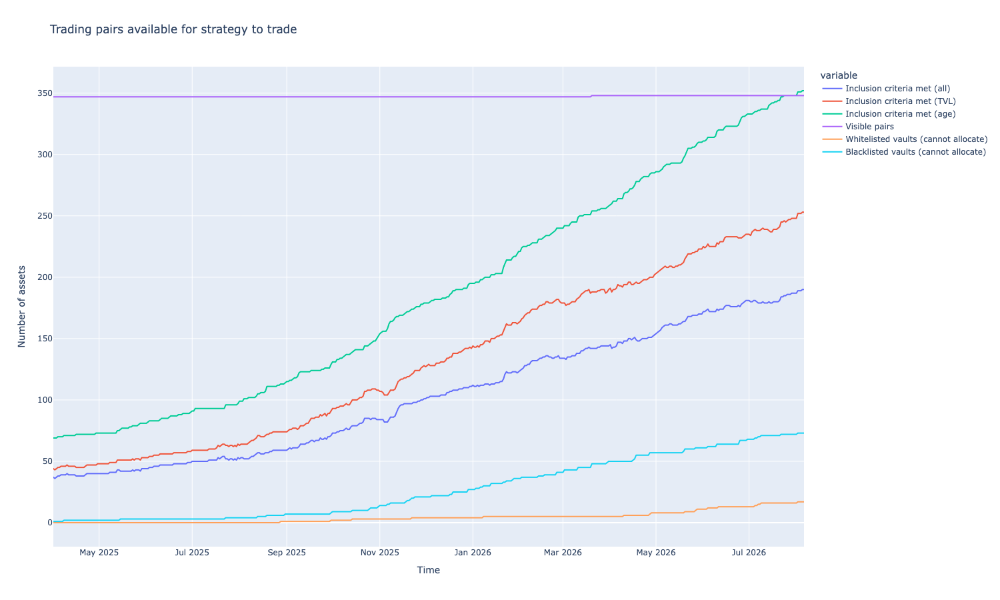

Head (5 rows)


,Inclusion criteria met (all),Inclusion criteria met (TVL),Inclusion criteria met (age),Visible pairs,Whitelisted vaults (cannot allocate),Blacklisted vaults (cannot allocate)
2024-06-01,4,7,14,340,0,0
2024-06-02,8,11,18,340,0,0
2024-06-03,8,11,18,340,0,0
2024-06-04,8,11,19,340,0,0
2024-06-05,8,11,19,340,0,0


Tail (5 rows)


,Inclusion criteria met (all),Inclusion criteria met (TVL),Inclusion criteria met (age),Visible pairs,Whitelisted vaults (cannot allocate),Blacklisted vaults (cannot allocate)
2026-08-02,189,252,351,348,17,73
2026-08-03,189,252,351,348,17,73
2026-08-04,189,252,351,348,17,73
2026-08-05,190,253,352,348,17,73
2026-08-06,190,253,352,348,17,73


In [9]:
indicator_data = calculate_and_load_indicators_inline(
    strategy_universe=strategy_universe,
    parameters=parameters,
    create_indicators=create_indicators,
    max_workers=1,
)

charts = create_charts(
    timestamp=None,
    parameters=parameters,
    strategy_universe=strategy_universe,
    execution_context=notebook_execution_context,
)
chart_renderer = ChartBacktestRenderingSetup(
    registry=charts,
    strategy_input_indicators=indicator_data,
    backtest_start_at=Parameters.backtest_start,
    backtest_end_at=Parameters.backtest_end,
)

fig, available_trading_pairs_df = chart_renderer.render(available_trading_pairs, with_dataframe=True)
fig.show()
display_head_and_tail(available_trading_pairs_df, head_rows=5, tail_rows=5)


## Backtest

Run the backtest and check the headline outcome.


In [10]:
result = run_backtest_inline(
    client=client,
    universe=strategy_universe,
    decide_trades=decide_trades,
    create_indicators=create_indicators,
    parameters=Parameters,
    initial_deposit=Parameters.initial_cash,
    reserve_currency=ReserveCurrency.usdc,
    trade_routing=Parameters.routing,
    engine_version=trading_strategy_engine_version,
    max_workers=1,
    name=Parameters.id,
)

state = result.state
indicator_data = result.indicators
trades = list(state.portfolio.get_all_trades())
bridge_trades = [trade for trade in trades if trade.pair.is_cctp_bridge()]
vault_trades = [trade for trade in trades if trade.pair.kind.is_vault()]
equity_curve = calculate_equity_curve(state)
returns = calculate_returns(equity_curve)
final_equity = state.portfolio.get_total_equity()
total_return = final_equity / Parameters.initial_cash - 1
satellite_vault_trades = [
    trade for trade in vault_trades
    if trade.pair.chain_id != Parameters.primary_chain_id.value
]

summary_df = pd.DataFrame(
    [
        ("Initial cash USD", Parameters.initial_cash),
        ("Final equity USD", final_equity),
        ("Total return", total_return),
        ("Equity curve points", len(equity_curve)),
        ("All trades", len(trades)),
        ("Vault trades", len(vault_trades)),
        ("CCTP bridge trades", len(bridge_trades)),
        ("Successful CCTP bridge trades", sum(trade.is_success() for trade in bridge_trades)),
        ("Satellite vault trades", len(satellite_vault_trades)),
    ],
    columns=["Metric", "Value"],
)

trade_chain_summary = pd.DataFrame(
    [
        (trade.pair.chain_id, trade.pair.kind.name, trade.get_value())
        for trade in trades
    ],
    columns=["Chain", "Kind", "Value USD"],
)
if not trade_chain_summary.empty:
    trade_chain_summary = (
        trade_chain_summary
        .groupby(["Chain", "Kind"], as_index=False)
        .agg(Trades=("Value USD", "size"), Total_value_usd=("Value USD", "sum"))
        .sort_values(["Chain", "Kind"])
    )

display(summary_df)
display(trade_chain_summary)

assert final_equity > Parameters.initial_cash, f"Expected profitable run, got final equity {final_equity:,.2f}"
assert all(trade.is_success() for trade in bridge_trades), "Expected all CCTP bridge trades to execute"

ignored_pair_ids = {pair.internal_id for pair in vault_pairs if pair.get_ignore_reason() is not None}
ignored_vault_trades = [trade for trade in vault_trades if trade.pair.internal_id in ignored_pair_ids]
assert not ignored_vault_trades, f"Expected no trades in ignored vaults, got {len(ignored_vault_trades)}"

2026-08-12 10:40:26,394 tradeexecutor.backtest.backtest_execution          WARNING  Fixing token sell amount to be within the epsilon. Wallet balance: 4547.234873624882950983790844, sell order quantity: -4547.2348736248832210549153387546539306640625, diff: 2.700711244947546539306640625E-13


2026-08-12 10:40:26,689 tradeexecutor.backtest.backtest_execution          WARNING  Fixing token sell amount to be within the epsilon. Wallet balance: 15558.22743907811484243347713, sell order quantity: -15558.227439078114912263117730617523193359375, diff: 6.9829640600617523193359375E-14


2026-08-12 10:40:27,066 tradeexecutor.backtest.backtest_execution          WARNING  Fixing token sell amount to be within the epsilon. Wallet balance: 15011.89782847394031805742184, sell order quantity: -15011.897828473940535332076251506805419921875, diff: 2.17274654411506805419921875E-13


2026-08-12 10:40:28,615 tradeexecutor.backtest.backtest_execution          WARNING  Fixing token sell amount to be within the epsilon. Wallet balance: 13510.93053747418661124359821, sell order quantity: -13510.930537474187076441012322902679443359375, diff: 4.65197414112902679443359375E-13


2026-08-12 10:40:35,404 tradeexecutor.backtest.backtest_execution          WARNING  Fixing token sell amount to be within the epsilon. Wallet balance: 86.153639693032820226464472, sell order quantity: -86.15364, diff: 3.06967179773535528E-7


2026-08-12 10:40:35,583 tradeexecutor.backtest.backtest_execution          WARNING  Fixing token sell amount to be within the epsilon. Wallet balance: 1831.634883894345850913964568, sell order quantity: -1831.634884, diff: 1.05654149086035432E-7


,Metric,Value
0,Initial cash USD,100000.000000
1,Final equity USD,113069.243286
2,Total return,0.130692
3,Equity curve points,492.000000
4,All trades,2682.000000
5,Vault trades,2131.000000
6,CCTP bridge trades,551.000000
7,Successful CCTP bridge trades,551.000000
8,Satellite vault trades,1513.000000


,Chain,Kind,Trades,Total_value_usd
0,1,cctp_bridge,313,1.966035e+06
1,1,vault,1035,2.790557e+06
2,8453,cctp_bridge,238,8.730014e+05
3,8453,vault,478,1.245898e+06
4,42161,vault,618,3.498563e+06


In [11]:
chart_renderer = ChartBacktestRenderingSetup(
    registry=charts,
    strategy_input_indicators=indicator_data,
    state=state,
    backtest_start_at=Parameters.backtest_start,
    backtest_end_at=Parameters.backtest_end,
)


## Ignored vaults and missing fee data

Vaults retained in the universe as data-only pairs (`ignore_reason="lacks_fee_data"`): excluded
from the inclusion criteria, never entered by the alpha model, listed with their missing fee
fields and Trading Strategy links.


In [12]:
ignored_vault_table = chart_renderer.render(ignored_vault_data)
display(ignored_vault_table)


Name,Chain,Address,Curator,Protocol,Missing fees,Link
Trust Wallet Fluid USDC,Arbitrum One,0x6db146db8dcf2f96948c3982f0770871246ae810,Trust Wallet,fluid,deposit fee,trust-wallet-fluid-usdc
Alpine Coinshift USDC,Ethereum,0x0985c88929a776a2e059615137a48ba5a473e25d,Alpine,upshift,"fee mode, management fee, performance fee",alpine-coinshift-usdc
Alpine USDC Flagship,Ethereum,0xd066649bcb7d8d3335fe29cad0aed6e17d5828b5,Alpine,upshift,"fee mode, management fee, performance fee",alpine-usdc-flagship
KANAME USDC,Ethereum,0xf5a987c061e0a125780e9de1457b63680316f260,Yearn,yearn,"deposit fee, withdrawal fee",kaname-usdc
Morpho-USDC->PG,Ethereum,0x214cc9861e6956bfc706dbb3855c5b2fd33ff000,Yearn,yearn,"deposit fee, withdrawal fee",morpho-usdc-pg
Multipli Upshift USDC,Ethereum,0x396a3f77ee1faf5a3c46e878ba7b7a2dcbe55517,August Digital,upshift,"fee mode, management fee, performance fee",multipli-upshift-usdc
Resolv USR Yield Maxi,Ethereum,0xda89af5bf2eb0b225d787abfa9095610f2e79e7d,M1 Capital,upshift,"fee mode, management fee, performance fee",resolv-usr-yield-maxi
Sylva Concentrated Liquidity,Ethereum,0xc428439fb7b1efe56360eb837ca98f551fdd9b26,Sylva.money,upshift,"fee mode, management fee, performance fee",sylva-concentrated-liquidity
Upshift AZT,Ethereum,0x69fc3f84fd837217377d9dae0212068ceb65818e,Upshift,upshift,"fee mode, management fee, performance fee",upshift-azt
Upshift Core USDC,Ethereum,0xe9b725010a9e419412ed67d0fa5f3a5f40159d32,August Digital,upshift,"fee mode, management fee, performance fee",upshift-core-usdc


## Vaults retained only for diagnostics

Whitelisted vaults require depositor allow-list approval. Producer-blacklisted vaults can enter a source list only accidentally; the default universe guard makes both data-only and lists them here.


In [13]:
whitelisted_vault_table = render_whitelisted_vaults(strategy_universe)
display(whitelisted_vault_table)

blacklisted_vault_table = render_blacklisted_vaults(strategy_universe)
display(blacklisted_vault_table)


Name,Protocol,Chain,Address
AltaETF,lagoon-finance,Ethereum,0x3be67ba2d3fec744d1d2b5d564c83f57372578e4
Block4Block,lagoon-finance,Ethereum,0x9fdbaaa76194d56e49cade12c1f216f47d2b865e
Der USDC,lagoon-finance,Ethereum,0xf10801bcc3deaf467fb8b3dbb7430111822e6dab
Der base USDC,lagoon-finance,Ethereum,0xba6cfe8a9d199cd7f3e50114c4e4ec66f2d52c87
Evergreen.001,lagoon-finance,Ethereum,0xb1e65871a38a483eee9436791ac016ddce3ae4ad
Muchacho USDC,lagoon-finance,Ethereum,0xef39d77c7fb6224ac974c5fa4e3151a6c6ce9594
Noon STS USDC,lagoon-finance,Ethereum,0xb993c32f578e5156369330787cf8c8fe033bf40e
Odyssey Stablecoins Discretionary,lagoon-finance,Ethereum,0xfd104766499a3ff60ea85b5c6015ba9e32b8c891
Odyssey Stablecoins Systematic,lagoon-finance,Ethereum,0x06940f2a8db4d579eebbc03f8dfa2abf46d64a41
Strada USDC,lagoon-finance,Ethereum,0xcb58582b0d52ce5feecb06ba9ce66598b0d57886


Name,Protocol,Chain,Address,Risk
Angmar Capital,lagoon-finance,Arbitrum One,0x1723cb57af58efb35a013870c90fcc3d60174a4e,Blacklisted
Arbitrum USDC Mix Yield Token,morpho,Arbitrum One,0xeba62b842081cef5a8184318dc5c4e4aaca9f651,Blacklisted
Blend USDC,morpho,Arbitrum One,0x9ce8a73296704d4689586347ef6e2087c2128f45,Blacklisted
Blend USDC Reserve,morpho,Arbitrum One,0xa47c5203d22ae173788a9d9be0f2beecc97f4df9,Blacklisted
Steakhouse High Yield Turbo,morpho,Arbitrum One,0xbeefff13dd098de415e07f033dae65205b31a894,Blacklisted
VaultMorpho,morpho,Arbitrum One,0x46ce9aa8167fa3e154395c25d19db25ddfcfeab4,Blacklisted
syrupUSDC/USDC Morpho Looper,morpho,Arbitrum One,0xbcf08997c34183d1b7b0f99e13aceacfba88e453,Blacklisted
ymevUSDC,yearn,Avalanche C-chain,0x7aca67a6856bf532a7b2dea9b20253f08bc9a85a,Blacklisted
Aave V3 USDC Lender,yearn,Base,0xc91e44e9302288fe5df24d6392875e5069e1aca7,Blacklisted
Avvio Base USDC,morpho,Base,0xef1e25cbb1672c180d0362e6c1afe531154b099f,Blacklisted


## Equity curve

Total portfolio equity through the backtest.


2026-08-12 10:40:52,235 choreographer.browser_async                        WARNING  Resorting to unclean kill browser.


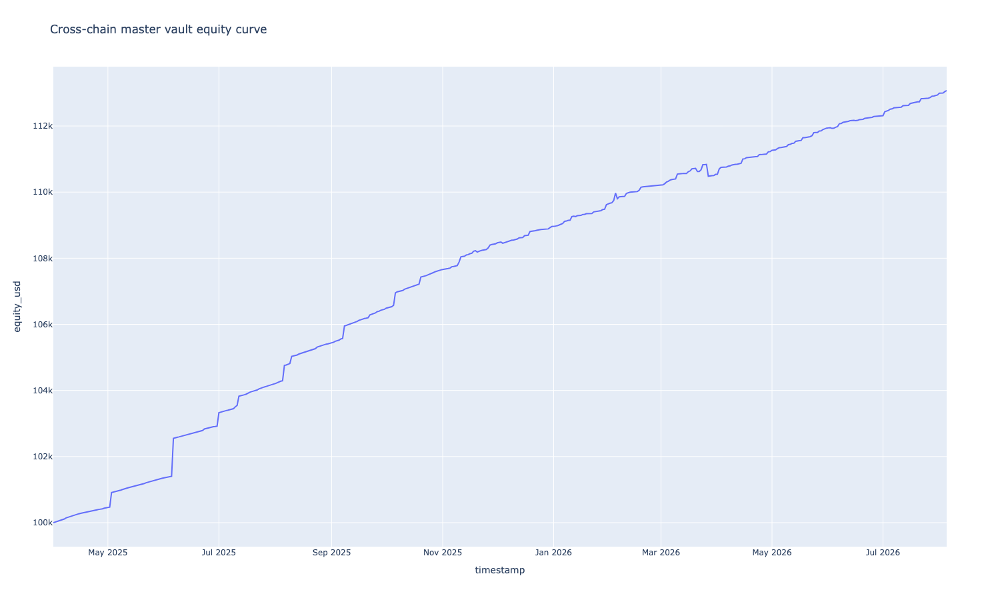

In [14]:
equity_df = equity_curve.rename("equity_usd").reset_index()
equity_df.columns = ["timestamp", "equity_usd"]
fig = px.line(equity_df, x="timestamp", y="equity_usd", title="Cross-chain master vault equity curve")
fig.show()

## Performance metrics

Standard performance metrics against BTC and ETH benchmarks.


In [15]:
performance_metrics_df = chart_renderer.render(performance_metrics)
display(performance_metrics_df)

,Strategy,BTC,ETH
Start Period,2025-04-01,2025-04-01,2025-04-01
End Period,2026-08-05,2026-08-05,2026-08-05
Risk-Free Rate,0.0%,0.0%,0.0%
Time in Market,100.0%,100.0%,100.0%
Cumulative Return,13.07%,-24.02%,0.08%
CAGR﹪,9.56%,-18.47%,0.06%
Sharpe,6.7,-0.28,0.34
Prob. Sharpe Ratio,100.0%,37.47%,65.55%
Smart Sharpe,6.55,-0.27,0.34
Sortino,28.49,-0.38,0.52


## Asset weight chart

How portfolio allocation moved across vault assets during the backtest.


2026-08-12 10:41:11,391 choreographer.browser_async                        WARNING  Resorting to unclean kill browser.


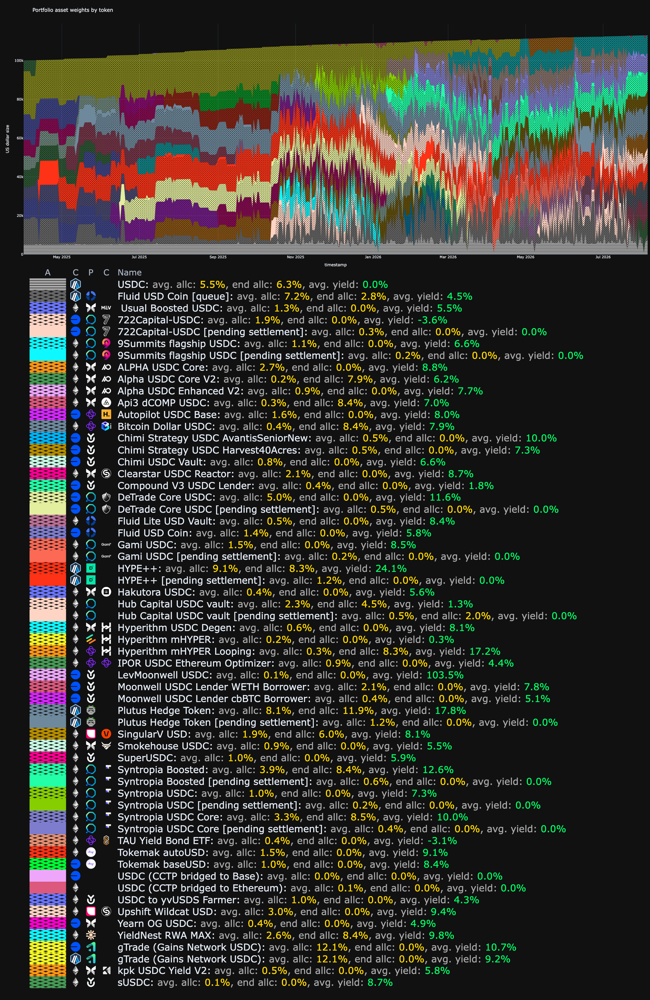

Vault name,First settle,Last settle,Settlements observed,Average estimation used,No-data settlement delay,Simulated no-data settlements
1212.Stable,NaT,NaT,0,2 days,4 days,0
722Capital-USDC,NaT,NaT,0,2 days,4 days,17
9Summits flagship USDC,NaT,NaT,0,2 days,4 days,10
AltaETF,NaT,NaT,0,2 days,4 days,0
Ammalgam USDC Vault,NaT,NaT,0,2 days,4 days,0
Angmar Capital,NaT,NaT,0,2 days,4 days,0
Autonomous Liquidity USD,NaT,NaT,0,2 days,4 days,0
Block4Block,NaT,NaT,0,2 days,4 days,0
Coinshift Conservative USPC,NaT,NaT,0,2 days,4 days,0
Cross-chain USDC Lending,NaT,NaT,0,2 days,4 days,0


In [16]:
token_weights_fig = chart_renderer.render(equity_curve_by_asset_with_legend)
token_weights_fig.show(width=token_weights_fig.layout.width, height=token_weights_fig.layout.height)

settlement_observations_df = chart_renderer.render(vault_settlement_observations)
display(settlement_observations_df.style.hide(axis="index"))


## Asset weights by liquidity state

How capital moved between ordinary deployed positions, raw cash, the free queue venue, deposits waiting for a target vault's deposit window, and deposits already in asynchronous settlement. The bands reconcile to total portfolio equity; patterned bands identify capital that is earmarked rather than freely allocatable.


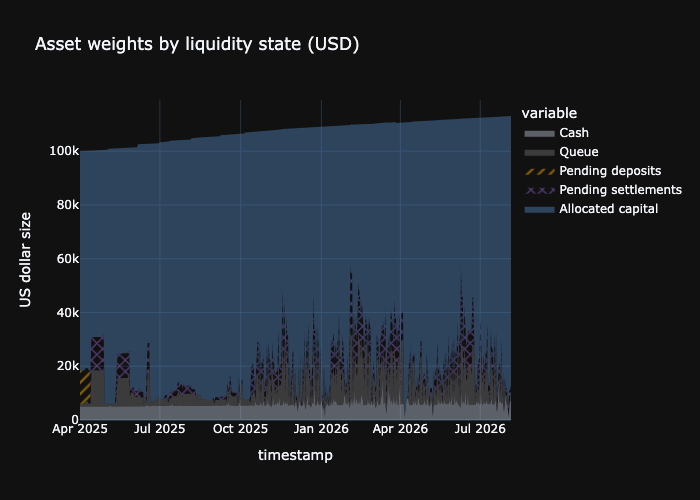

In [17]:
liquidity_state_weights_fig, liquidity_state_weights_df = chart_renderer.render(equity_curve_by_liquidity_state)
liquidity_state_weights_fig.show(width=liquidity_state_weights_fig.layout.width, height=liquidity_state_weights_fig.layout.height)


## Chain weight chart

USD allocation per chain over time, with the queue venue as its own band.


2026-08-12 10:41:28,940 choreographer.browser_async                        WARNING  Resorting to unclean kill browser.


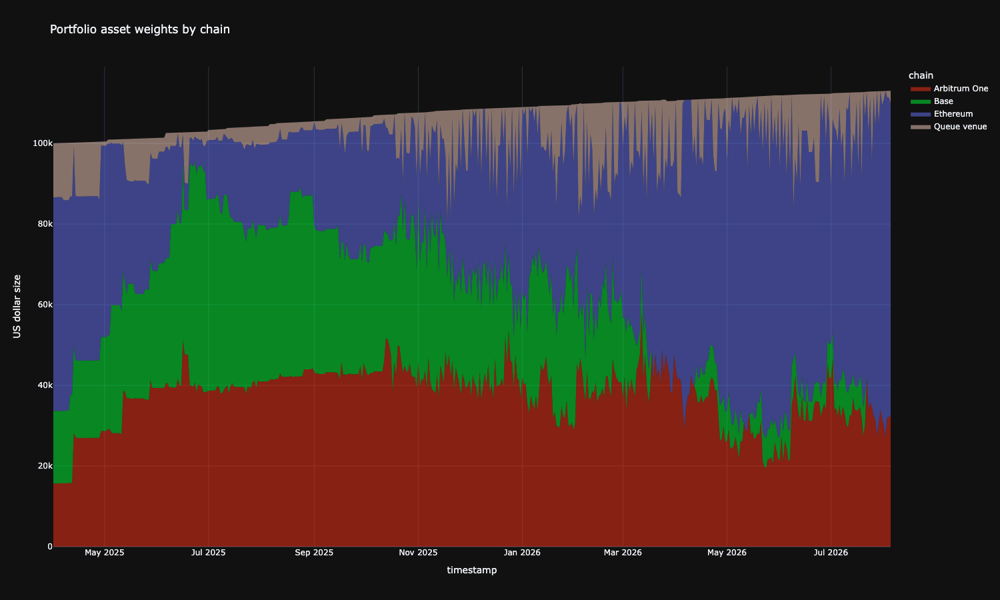

Head (10 rows)


chain,Arbitrum One,Base,Ethereum,Queue venue
timestamp,,,,
2025-04-01,15681.704546,17945.263636,52981.254545,13391.777273
2025-04-02,15684.053226,17949.863751,52991.517719,13393.915801
2025-04-03,15687.448798,17956.440191,52994.685367,13395.902480
2025-04-04,15689.506169,17961.876974,52998.300072,13398.230818
2025-04-05,15692.401053,17968.139580,53007.340697,13400.331384
2025-04-06,15693.429738,17971.461116,53023.443696,13402.685030
2025-04-07,15774.209705,17964.400839,52180.662824,14191.686228
2025-04-08,15724.260041,17972.710659,52185.211085,14260.864905
2025-04-09,15730.031603,17979.900422,52188.734556,14262.964640


Tail (10 rows)


chain,Arbitrum One,Base,Ethereum,Queue venue
timestamp,,,,
2026-07-27,31587.611779,0.0,72618.835572,8659.874661
2026-07-28,27353.819756,0.0,85551.450525,0.000000
2026-07-29,30577.445097,0.0,74244.797240,8087.005350
2026-07-30,33883.942436,0.0,79048.625943,0.000000
2026-07-31,31613.303413,0.0,77882.426953,3444.340100
2026-08-01,29861.154629,0.0,80967.246895,2166.322834
2026-08-02,27299.362389,0.0,85692.041497,0.000000
2026-08-03,32076.028576,0.0,79360.024111,1561.860426
2026-08-04,32210.448728,0.0,79105.406608,1726.226963


In [18]:
chain_weights_fig, chain_weights_df = chart_renderer.render(equity_curve_by_chain)
chain_weights_fig.update_layout(title="Portfolio asset weights by chain")
chain_weights_fig.show()
display_head_and_tail(chain_weights_df, head_rows=10, tail_rows=10)

## Pending settlements chart

Capital pending in async vault settlements and the phase-aware trigger queue.


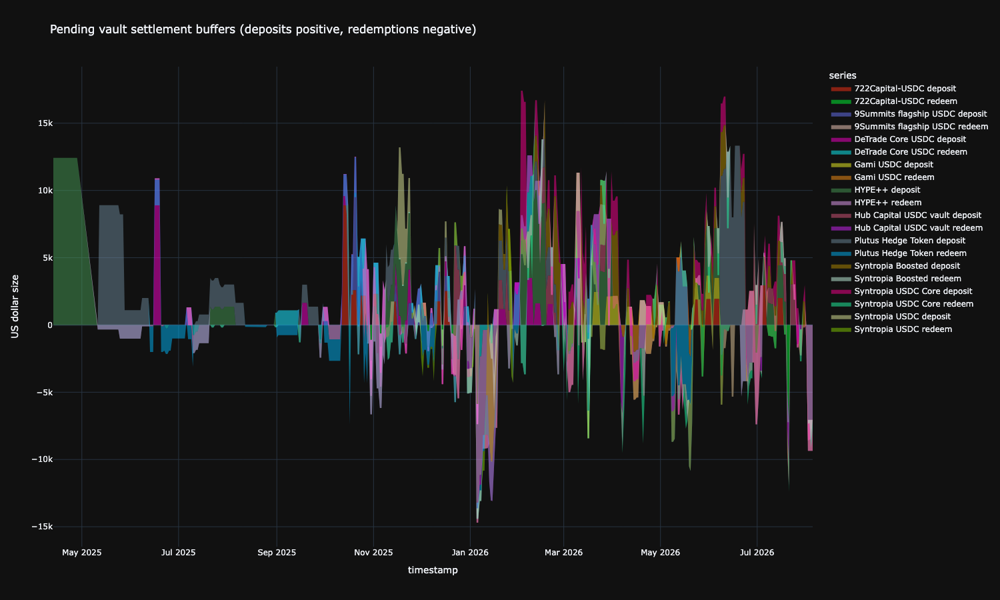

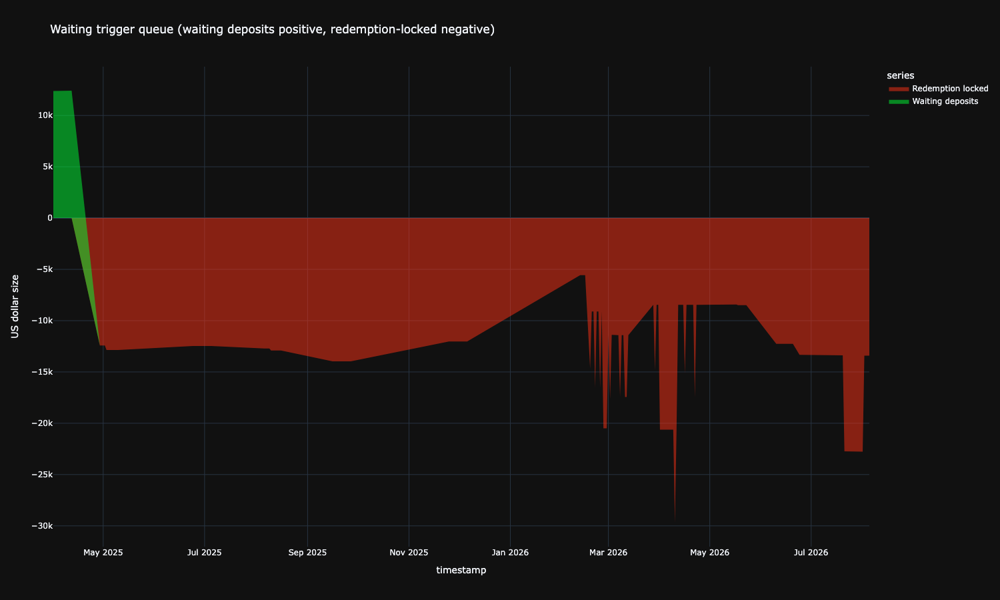

Head (5 rows)


series,Redemption locked,Waiting deposits
timestamp,,
2025-04-01,0.0,12390.777273
2025-04-02,0.0,12393.200483
2025-04-03,0.0,12395.094713
2025-04-04,0.0,12396.777416
2025-04-05,0.0,12399.319365


Tail (5 rows)


series,Redemption locked,Waiting deposits
timestamp,,
2026-08-01,-22768.748145,0.0
2026-08-02,-13408.610368,0.0
2026-08-03,-13408.610368,0.0
2026-08-04,-13408.610368,0.0
2026-08-05,-13408.610368,0.0


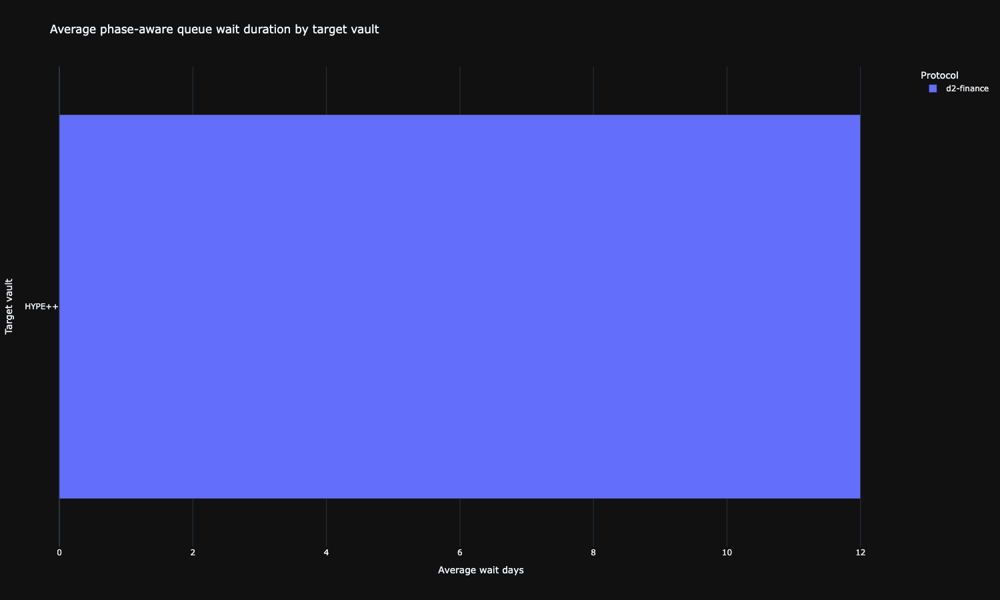

,Vault id,Vault,Ticker,Protocol,Chain,Episodes,Promoted,Closed,Open,Average wait days,Median wait days,Max wait days,Average start USD,Max queued USD,USD days
0,272519172,HYPE++,HYPE++-USDC,d2-finance,42161,1,1,0,0,12.0,12.0,12.0,12390.777273,12418.553207,148849.680594


,Vault id,Vault,Ticker,Protocol,Chain,Episodes,Promoted,Closed,Open,Average wait days,Median wait days,Max wait days,Average start USD,Max queued USD,USD days
0,272519172,HYPE++,HYPE++-USDC,d2-finance,42161,1,1,0,0,12.0,12.0,12.0,12390.777273,12418.553207,148849.680594


,Component,USD
0,Fluid queue venue,3212.850604
1,Waiting-deposit earmarks,0.000000
2,Free queue liquidity,3212.850604
3,Raw USDC reserve,7148.471354
4,Pending async deposit claims,2301.837498


""


,Vault,Chain,USD,Cycle,Event timestamp
0,Plutus Hedge Token,42161,13408.610368,488,2026-08-01T00:00:00


,Kind,USD,Cycle,Timestamp
0,park,12390.777273,1,2025-04-01T00:00:00
1,park,12393.200483,2,2025-04-02T00:00:00
2,park,12395.094713,3,2025-04-03T00:00:00
3,park,12396.777416,4,2025-04-04T00:00:00
4,park,12399.319365,5,2025-04-05T00:00:00
5,park,12402.175407,6,2025-04-06T00:00:00
6,park,12404.672440,7,2025-04-07T00:00:00
7,park,12408.690620,8,2025-04-08T00:00:00
8,park,12411.017910,9,2025-04-09T00:00:00
9,park,12412.841151,10,2025-04-10T00:00:00


,Vault,Protocol,Chain,Pending deposit USD,Position id,Request trade ids,Request opened
0,Hub Capital USDC vault,lagoon-finance,1,2301.837498,198,2663,2026-08-02 00:00:00


,Trade id,Opened,Executed,Side,Status,Value USD
0,2664,2026-08-02,None,Sell / redeem,vault_settlement_pending,9360.137777


,Metric,Value
0,Final cycle,2026-08-05 00:00:00
1,Total equity USD,113069.24
2,Cash USD,7139.86
3,Cash % of equity,0.063146
4,Redeemable capital USD,NaN
5,Pending redemptions USD,NaN
6,Investable equity USD,64368.46
7,Accepted investable equity USD,64368.46
8,Accepted / investable %,1.0
9,Allocated to signals USD,104112.94


,Signal,Asked size,Accepted size,Value adjust USD,Weights (raw),Weights (norm/cap),Old weight,Flipping,TVL,Pending deposit USD,Pending redemption USD,Parked USD,Waiting deposit USD,Deposit block reason,Deposit block message,Max deposit,Waiting redemption USD,Flags
Pair,,,,,,,,,,,,,,,,,,
svUSDC-USDC,0.926667,6945.018138,6945.018138,0.0,0.073214,0.107895,0.066280,no flip,2034881,-,-,-,-,-,-,-,-,max_adjust_too_small
alphaUSDCCoreV2-USDC,0.960000,9147.09706,9147.097060,0.0,0.096429,0.142105,0.087315,no flip,2585537,-,-,-,-,-,-,-,-,max_adjust_too_small
Api3-dCOMP-USDC-USDC,0.966667,9655.269119,9655.269119,0.0,0.119643,0.150000,0.092029,no flip,12400760,-,-,-,-,-,-,-,-,"capped_by_concentration, max_adjust_too_small"
ipormHYPER-USDC,0.973333,9655.269119,9655.269119,0.0,0.142857,0.150000,0.091002,no flip,175029,-,-,-,-,-,-,-,-,"capped_by_concentration, max_adjust_too_small"
ynRWAx-USDC,0.980000,9655.269119,9655.269119,0.0,0.166071,0.150000,0.092013,no flip,9226876,-,-,-,-,-,-,-,-,"capped_by_concentration, max_adjust_too_small"
bdUSD-USDC,0.986667,9655.269119,9655.269119,0.0,0.189286,0.150000,0.092027,no flip,726874,-,-,-,-,-,-,-,-,"capped_by_concentration, max_adjust_too_small"
synUSDx-USDC,0.993333,9655.269119,9655.269119,0.0,0.212500,0.150000,0.092368,no flip,357685,-,-,-,-,-,-,-,-,"capped_by_concentration, max_adjust_too_small"
HubCap-USDC-USDC,7373.909823,-,7373.909823,0.0,0.000000,0.000000,0.071795,no flip,0,2301.837498,-,-,-,-,-,-,-,"settlement_pending, max_adjust_too_small"
HYPE++-USDC,9360.137777,-,9360.137777,0.0,0.000000,0.000000,0.091134,no flip,0,-,9360.137777,-,-,-,-,-,-,"settlement_pending, max_adjust_too_small"


,Cycle timestamp,Vault,Pair,Address,Blocked buy USD,Reason code,Reason detail,Max deposit USD


In [19]:
settlement_fig, settlement_df = chart_renderer.render(pending_vault_settlements)
settlement_fig.show()

trigger_fig, trigger_df = chart_renderer.render(pending_trigger_queue)
trigger_fig.show()
if not trigger_df.empty:
    display_head_and_tail(trigger_df, head_rows=5, tail_rows=5)
queue_duration_fig, queue_duration_df = chart_renderer.render(phase_aware_queue_duration)
queue_duration_fig.show()
if not queue_duration_df.empty:
    display(queue_duration_df)

queue_duration_summary_df = chart_renderer.render(phase_aware_queue_duration_summary)
if not queue_duration_summary_df.empty:
    display(queue_duration_summary_df)

# End-of-backtest queue reconciliation: distinguish target earmarks from free sweep liquidity.
from tradeexecutor.strategy.phase_aware import iter_all_events, read_open_park_events, read_open_redeem_block_events

open_parks = read_open_park_events(state.other_data)
open_redemption_locks = read_open_redeem_block_events(state.other_data)
end_queue_usd = float(chain_weights_df.iloc[-1]["Queue venue"])
waiting_deposits_usd = sum(event.usd for event in open_parks.values())
display(pd.DataFrame([
    ("Fluid queue venue", end_queue_usd),
    ("Waiting-deposit earmarks", waiting_deposits_usd),
    ("Free queue liquidity", end_queue_usd - waiting_deposits_usd),
    ("Raw USDC reserve", float(state.portfolio.get_cash())),
    ("Pending async deposit claims", state.portfolio.get_vault_settlement_pending_value()),
], columns=["Component", "USD"]))

def resolve_queue_event(event):
    pair = strategy_universe.get_pair_by_id(event.vault_internal_id)
    return {
        "Vault": pair.get_vault_name() or pair.get_ticker(),
        "Chain": pair.chain_id,
        "USD": event.usd,
        "Cycle": event.cycle,
        "Event timestamp": event.timestamp,
    }

display(pd.DataFrame([resolve_queue_event(event) for event in open_parks.values()]))
display(pd.DataFrame([resolve_queue_event(event) for event in open_redemption_locks.values()]))

# HYPE++'s full phase-aware event history proves whether its redemption lock cleared during
# the 3-4 August synthetic window and, if so, whether a later closed-window cycle re-blocked it.
hype_pair = strategy_universe.get_pair_by_smart_contract(WINDOW_GATED_VAULTS[0][1])
hype_events_df = pd.DataFrame([
    {
        "Kind": event.kind,
        "USD": event.usd,
        "Cycle": event.cycle,
        "Timestamp": event.timestamp,
    }
    for event in iter_all_events(state.other_data)
    if event.vault_internal_id == hype_pair.internal_id
])
display(hype_events_df)

# Pending settlement deposits are outside the Fluid queue. List their vaults separately so
# operational settlement latency cannot be mistaken for unallocated queue liquidity.
pending_settlement_rows = []
for position in state.portfolio.get_all_positions(pending=True):
    pending_value = position.get_vault_settlement_pending_value()
    if pending_value <= 0:
        continue
    pending_trades = [
        trade
        for trade in position.trades.values()
        if trade.is_vault_settlement_in_flight() and trade.is_buy()
    ]
    pending_settlement_rows.append({
        "Vault": position.pair.get_vault_name() or position.pair.get_ticker(),
        "Protocol": position.pair.exchange_name,
        "Chain": position.pair.chain_id,
        "Pending deposit USD": pending_value,
        "Position id": position.position_id,
        "Request trade ids": ", ".join(str(trade.trade_id) for trade in pending_trades),
        "Request opened": ", ".join(str(trade.opened_at) for trade in pending_trades),
    })

display(pd.DataFrame(pending_settlement_rows))

# A redemption lock is an availability diagnostic, not a withdrawal order. Show the HYPE++
# ledger around the final window so any actual deposit or redemption is explicit.
hype_window_start = datetime.datetime(2026, 8, 1)
hype_window_end = datetime.datetime(2026, 8, 6)
hype_window_trades_df = pd.DataFrame([
    {
        "Trade id": trade.trade_id,
        "Opened": trade.opened_at,
        "Executed": trade.executed_at,
        "Side": "Buy / deposit" if trade.is_buy() else "Sell / redeem",
        "Status": trade.get_status().value,
        "Value USD": trade.get_value(),
    }
    for trade in trades
    if trade.pair.internal_id == hype_pair.internal_id
    and trade.opened_at is not None
    and hype_window_start <= trade.opened_at < hype_window_end
])
display(hype_window_trades_df)

# Final-cycle allocation audit: expose whether the directional allocator accepted the
# deployable capital and which final-cycle signals were constrained or skipped.
final_cycle_snapshot_df = chart_renderer.render(latest_cycle_snapshot)
display(final_cycle_snapshot_df)
final_alpha_model_df = chart_renderer.render(alpha_model_diagnostics)
display(final_alpha_model_df)

# Deposit-gate audit: `cannot_deposit` is a trade-generation result, not an allocator
# decision. Persisted per-cycle results identify whether the protocol was closed, the
# owner cap was zero, or an asynchronous request manager rejected the request.
deposit_block_rows = []
for cycle_timestamp, calculations in state.visualisation.calculations.items():
    for event in calculations.get("missed_vault_events", []):
        if event.get("event_type") != "deposit":
            continue
        deposit_block_rows.append({
            "Cycle timestamp": cycle_timestamp,
            "Vault": event.get("vault_name"),
            "Pair": event.get("pair_ticker"),
            "Address": event.get("vault_address"),
            "Blocked buy USD": event.get("missed_usd", 0.0),
            "Reason code": event.get("reason_code", "legacy/unknown"),
            "Reason detail": event.get("reason_message", "No structured diagnostic recorded"),
            "Max deposit USD": event.get("max_deposit"),
        })

deposit_blocks_df = pd.DataFrame(deposit_block_rows)
if deposit_blocks_df.empty:
    display(pd.DataFrame(columns=["Cycle timestamp", "Vault", "Pair", "Address", "Blocked buy USD", "Reason code", "Reason detail", "Max deposit USD"]))
else:
    deposit_blocks_df = deposit_blocks_df.sort_values(["Cycle timestamp", "Blocked buy USD"], ascending=[False, False])
    latest_deposit_blocks_df = deposit_blocks_df[deposit_blocks_df["Cycle timestamp"] == deposit_blocks_df["Cycle timestamp"].max()]
    display(latest_deposit_blocks_df)
    display(
        deposit_blocks_df.groupby(["Vault", "Address", "Reason code", "Reason detail", "Max deposit USD"], dropna=False, as_index=False)
        .agg(
            First_blocked_cycle=("Cycle timestamp", "min"),
            Last_blocked_cycle=("Cycle timestamp", "max"),
            Blocked_cycles=("Cycle timestamp", "size"),
            Total_blocked_buy_usd=("Blocked buy USD", "sum"),
        )
        .sort_values("Total_blocked_buy_usd", ascending=False)
    )


In [20]:
from eth_defi.erc_4626.core import ERC4626Feature

# Protocol settlement and stale-data utilisation audit. These rows come from the realised
# backtest trade ledger, so they expose the effective flow rather than only configured metadata.
settlement_features = {ERC4626Feature.lagoon_like, ERC4626Feature.d2_like, ERC4626Feature.plutus_like}
stale_deposit_features = {ERC4626Feature.lagoon_like, ERC4626Feature.morpho_v2_like, ERC4626Feature.yearn_v3_like}

protocol_rows = []
stale_rows = []
for pair in vault_pairs:
    features = pair.get_vault_features() or set()
    pair_trades = [trade for trade in vault_trades if trade.pair.internal_id == pair.internal_id]
    if features & settlement_features:
        for trade in pair_trades:
            estimated_at = trade.other_data.get("vault_settlement_estimated_at")
            estimated_delay_days = None
            if estimated_at and trade.opened_at:
                estimated_delay_days = (datetime.datetime.fromisoformat(estimated_at) - trade.opened_at).total_seconds() / 86_400
            protocol_rows.append({
                "Vault": pair.get_vault_name() or pair.get_ticker(),
                "Protocol": pair.get_vault_protocol(),
                "Features": ", ".join(sorted(feature.value for feature in features & settlement_features)),
                "Side": "deposit" if trade.is_buy() else "redeem",
                "Opened": trade.opened_at,
                "Status": trade.get_status().value,
                "Metadata settlement days": pair.get_vault_estimated_settlement().total_seconds() / 86_400 if pair.get_vault_estimated_settlement() else None,
                "Applied settlement days": estimated_delay_days,
                "Historical settlement required": bool(trade.other_data.get("vault_settlement_historical_event_required")),
                "Historical settlement event": trade.other_data.get("vault_settlement_historical_event_at"),
                "Last observed historical event": trade.other_data.get("vault_settlement_last_historical_event_at"),
                "Value USD": trade.get_value(),
            })
    if features & stale_deposit_features:
        stale_rows.append({
            "Vault": pair.get_vault_name() or pair.get_ticker(),
            "Protocol": pair.get_vault_protocol(),
            "Features": ", ".join(sorted(feature.value for feature in features & stale_deposit_features)),
            "Deposit trades": sum(trade.is_buy() for trade in pair_trades),
            "Successful deposits": sum(trade.is_buy() and trade.is_success() for trade in pair_trades),
            "Pending deposits": sum(trade.is_buy() and trade.is_vault_settlement_in_flight() for trade in pair_trades),
            "Deposit value USD": sum(trade.get_value() for trade in pair_trades if trade.is_buy()),
        })

protocol_settlement_audit_df = pd.DataFrame(protocol_rows).sort_values(["Vault", "Opened"])
stale_vault_utilisation_df = pd.DataFrame(stale_rows).sort_values(["Successful deposits", "Deposit trades"], ascending=False)
protocol_settlement_summary_df = (
    protocol_settlement_audit_df
    .groupby(["Vault", "Protocol", "Features", "Side", "Status", "Metadata settlement days", "Applied settlement days", "Historical settlement required", "Historical settlement event", "Last observed historical event"], dropna=False, as_index=False)
    .agg(Trades=("Opened", "size"), First_trade=("Opened", "min"), Last_trade=("Opened", "max"), Total_value_USD=("Value USD", "sum"))
    .sort_values(["Vault", "Side", "Status"])
)
settlement_evidence_rows = []
for pair in vault_pairs:
    features = pair.get_vault_features() or set()
    if not features & settlement_features:
        continue
    pair_state = strategy_universe.vault_state
    pair_events = pair_state[(pair_state["pair_id"] == pair.internal_id) & pair_state.get("vault_settlement_at", pd.Series(index=pair_state.index, dtype="datetime64[ns]")).notna()] if pair_state is not None and "vault_settlement_at" in pair_state.columns else pd.DataFrame()
    settlement_evidence_rows.append({
        "Vault": pair.get_vault_name() or pair.get_ticker(),
        "Historical events": len(pair_events),
        "First historical event": pair_events["vault_settlement_at"].min() if len(pair_events) else None,
        "Last historical event": pair_events["vault_settlement_at"].max() if len(pair_events) else None,
    })
settlement_evidence_df = pd.DataFrame(settlement_evidence_rows).sort_values("Vault")
display(settlement_evidence_df)
display(protocol_settlement_summary_df)
display(stale_vault_utilisation_df[stale_vault_utilisation_df["Deposit trades"] > 0])


# Portfolio-stability experiment audit: reconcile vault PnL, turnover and holding periods.
position_rows = []
for position in state.portfolio.get_all_positions(pending=True):
    if not position.pair.is_vault():
        continue
    terminal_at = position.closed_at or (Parameters.backtest_end - datetime.timedelta(days=1))
    position_trades = list(position.trades.values())
    position_rows.append({
        "Vault": position.pair.get_vault_name() or position.pair.get_ticker(),
        "Protocol": position.pair.get_vault_protocol(),
        "Chain": int(position.pair.chain_id),
        "Positions": 1,
        "Trades": len(position_trades),
        "Turnover USD": sum(trade.get_value() for trade in position_trades if trade.is_success() or trade.is_pending()),
        "Profit USD": position.get_total_profit_usd(),
        "Holding days": (terminal_at - position.opened_at).total_seconds() / 86_400,
    })

position_audit_df = pd.DataFrame(position_rows)
vault_contribution_df = (
    position_audit_df
    .groupby(["Vault", "Protocol", "Chain"], as_index=False)
    .agg(
        Positions=("Positions", "sum"),
        Trades=("Trades", "sum"),
        Turnover_USD=("Turnover USD", "sum"),
        Profit_USD=("Profit USD", "sum"),
        Average_holding_days=("Holding days", "mean"),
    )
)
vault_contribution_df["Profit_bps_per_turnover"] = vault_contribution_df["Profit_USD"] / vault_contribution_df["Turnover_USD"].replace(0, np.nan) * 10_000

membership_changes = 0
previous_members = None
for cycle in sorted(state.other_data.data, key=int):
    members = state.other_data.data[cycle].get(STABLE_MEMBERS_KEY)
    if members is None:
        continue
    current_members = tuple(members)
    if previous_members is not None and current_members != previous_members:
        membership_changes += 1
    previous_members = current_members

comparison_df = pd.DataFrame([
    ("Final equity USD", 113_586.409126, final_equity),
    ("CAGR", 0.09933123, (final_equity / Parameters.initial_cash) ** (365 / ((Parameters.backtest_end - datetime.timedelta(days=1) - Parameters.backtest_start).days)) - 1),
    ("All trades", 1_558, len(trades)),
    ("Vault trades", 1_188, len(vault_trades)),
    ("CCTP bridge trades", 370, len(bridge_trades)),
    ("Vault turnover USD", 4_592_448.0, position_audit_df["Turnover USD"].sum()),
    ("Median position holding days", 30.0, position_audit_df["Holding days"].median()),
], columns=["Metric", "NB33", "NB40"])
comparison_df["Change"] = comparison_df["NB40"] - comparison_df["NB33"]

daily_jump_df = pd.concat([returns.nlargest(5), returns.nsmallest(5)]).sort_values(ascending=False).rename("Daily return").reset_index()
experiment_diagnostics_df = pd.DataFrame([
    ("Distinct vaults traded", len(vault_contribution_df)),
    ("Vault positions", len(position_audit_df)),
    ("Membership changes", membership_changes),
    ("Positions held <= 2 days", int((position_audit_df["Holding days"] <= 2).sum())),
    ("Positions held <= 7 days", int((position_audit_df["Holding days"] <= 7).sum())),
    ("Negative-PnL vaults", int((vault_contribution_df["Profit_USD"] < 0).sum())),
    ("Total negative vault PnL USD", vault_contribution_df.loc[vault_contribution_df["Profit_USD"] < 0, "Profit_USD"].sum()),
], columns=["Metric", "Value"])

display(comparison_df)
display(experiment_diagnostics_df)
display(vault_contribution_df.sort_values("Profit_USD", ascending=False).head(15))
display(vault_contribution_df.sort_values("Profit_USD").head(15))
display(daily_jump_df)

valuation_change_rows = []
for position in state.portfolio.get_all_positions(pending=True):
    if not position.pair.is_vault():
        continue
    for update in position.valuation_updates:
        if update.quantity is None or update.old_price is None or update.new_price is None:
            continue
        valuation_change_rows.append({
            "Date": pd.Timestamp(update.created_at).normalize(),
            "Vault": position.pair.get_vault_name() or position.pair.get_ticker(),
            "Valuation PnL USD": float(update.quantity) * (float(update.new_price) - float(update.old_price)),
        })
    for update in position.balance_updates.values():
        if update.cause.value != "interest":
            continue
        event_at = update.strategy_cycle_included_at or update.block_mined_at
        valuation_change_rows.append({
            "Date": pd.Timestamp(event_at).normalize(),
            "Vault": position.pair.get_vault_name() or position.pair.get_ticker(),
            "Valuation PnL USD": float(update.usd_value),
        })
valuation_change_df = pd.DataFrame(valuation_change_rows, columns=["Date", "Vault", "Valuation PnL USD"])
largest_day = pd.Timestamp(returns.idxmax()).normalize()
worst_day = pd.Timestamp(returns.idxmin()).normalize()
jump_attribution_df = valuation_change_df[valuation_change_df["Date"].isin([largest_day, worst_day])]
if not jump_attribution_df.empty:
    jump_attribution_df = (
        jump_attribution_df
        .groupby(["Date", "Vault"], as_index=False)["Valuation PnL USD"].sum()
        .sort_values(["Date", "Valuation PnL USD"], ascending=[True, False])
    )
display(jump_attribution_df)


,Vault,Historical events,First historical event,Last historical event
23,1212.Stable,0,None,None
44,722Capital-USDC,0,None,None
0,9Summits flagship USDC,0,None,None
9,AltaETF,0,None,None
14,Ammalgam USDC Vault,0,None,None
36,Angmar Capital,0,None,None
29,Autonomous Liquidity USD,0,None,None
16,Block4Block,0,None,None
33,Coinshift Conservative USPC,0,None,None
31,Cross-chain USDC Lending,0,None,None


,Vault,Protocol,Features,Side,Status,Metadata settlement days,Applied settlement days,Historical settlement required,Historical settlement event,Last observed historical event,Trades,First_trade,Last_trade,Total_value_USD
0,722Capital-USDC,lagoon-finance,lagoon_like,deposit,success,NaN,2.0,True,NaN,NaN,17,2025-10-13,2026-07-14,45949.857675
1,722Capital-USDC,lagoon-finance,lagoon_like,redeem,success,NaN,2.0,False,NaN,NaN,25,2025-10-22,2026-07-20,45851.545303
2,9Summits flagship USDC,lagoon-finance,lagoon_like,deposit,success,NaN,2.0,True,NaN,NaN,10,2025-10-20,2025-12-28,25406.324282
3,9Summits flagship USDC,lagoon-finance,lagoon_like,redeem,success,NaN,2.0,False,NaN,NaN,16,2025-10-30,2026-01-05,25509.735192
4,DeTrade Core USDC,lagoon-finance,lagoon_like,deposit,success,NaN,2.0,True,NaN,NaN,24,2025-06-16,2026-03-08,67124.085660
5,DeTrade Core USDC,lagoon-finance,lagoon_like,redeem,success,NaN,2.0,False,NaN,NaN,39,2025-06-23,2026-03-16,67940.583542
6,Gami USDC,lagoon-finance,lagoon_like,deposit,success,NaN,2.0,True,NaN,NaN,13,2026-03-09,2026-06-04,27581.242740
7,Gami USDC,lagoon-finance,lagoon_like,redeem,success,NaN,2.0,False,NaN,NaN,17,2026-03-18,2026-06-15,27770.863006
8,HYPE++,d2-finance,d2_like,deposit,success,NaN,14.0,True,NaN,NaN,8,2025-04-13,2026-07-05,40159.356383
9,HYPE++,d2-finance,d2_like,redeem,success,NaN,14.0,False,NaN,NaN,15,2025-05-11,2026-06-21,33727.839326


,Vault,Protocol,Features,Deposit trades,Successful deposits,Pending deposits,Deposit value USD
48,Syntropia Boosted,lagoon-finance,lagoon_like,28,28,0,77245.262167
12,Syntropia USDC Core,lagoon-finance,lagoon_like,24,24,0,55054.349491
154,DeTrade Core USDC,lagoon-finance,lagoon_like,24,24,0,67124.085660
52,Alpha USDC Enhanced V2,morpho,morpho_v2_like,19,19,0,46028.327751
86,Hub Capital USDC vault,lagoon-finance,lagoon_like,19,18,1,62966.940309
162,722Capital-USDC,lagoon-finance,lagoon_like,17,17,0,45949.857675
172,Chimi USDC Vault,yearn,yearn_v3_like,16,16,0,41181.939735
97,Gami USDC,lagoon-finance,lagoon_like,13,13,0,27581.242740
0,9Summits flagship USDC,lagoon-finance,lagoon_like,10,10,0,25406.324282
92,kpk USDC Yield V2,morpho,morpho_v2_like,9,9,0,21535.679356


,Metric,NB33,NB40,Change
0,Final equity USD,1.135864e+05,1.130692e+05,-5.171658e+02
1,CAGR,9.933123e-02,9.560819e-02,-3.723042e-03
2,All trades,1.558000e+03,2.682000e+03,1.124000e+03
3,Vault trades,1.188000e+03,2.131000e+03,9.430000e+02
4,CCTP bridge trades,3.700000e+02,5.510000e+02,1.810000e+02
5,Vault turnover USD,4.592448e+06,7.522708e+06,2.930260e+06
6,Median position holding days,3.000000e+01,2.550000e+01,-4.500000e+00


,Metric,Value
0,Distinct vaults traded,47.000000
1,Vault positions,96.000000
2,Membership changes,34.000000
3,Positions held <= 2 days,14.000000
4,Positions held <= 7 days,36.000000
5,Negative-PnL vaults,2.000000
6,Total negative vault PnL USD,-114.458994


,Vault,Protocol,Chain,Positions,Trades,Turnover_USD,Profit_USD,Average_holding_days,Profit_bps_per_turnover
19,HYPE++,d2-finance,42161,2,24,7.388720e+04,2928.620719,232.500000,396.363767
29,Plutus Hedge Token,plutus,42161,2,22,6.702967e+04,1975.740186,216.500000,294.756048
44,gTrade (Gains Network USDC),gains-network,42161,1,172,4.284647e+05,884.288701,391.000000,20.638544
43,gTrade (Gains Network USDC),gains-network,8453,1,127,3.759244e+05,831.195054,286.000000,22.110697
14,DeTrade Core USDC,lagoon-finance,8453,1,63,1.350647e+05,816.497882,275.000000,60.452366
33,Syntropia Boosted,lagoon-finance,1,1,64,1.457070e+05,703.397303,205.000000,48.274774
35,Syntropia USDC Core,lagoon-finance,1,1,56,1.009841e+05,477.248654,184.000000,47.259771
17,Fluid USD Coin,fluid,42161,44,400,2.919821e+06,469.226168,10.068182,1.607037
40,Upshift Wildcat USD,upshift,1,1,143,5.230383e+05,405.510889,189.000000,7.752987
42,YieldNest RWA MAX,yieldnest,1,1,116,4.151045e+05,363.615504,156.000000,8.759614


,Vault,Protocol,Chain,Positions,Trades,Turnover_USD,Profit_USD,Average_holding_days,Profit_bps_per_turnover
1,722Capital-USDC,lagoon-finance,8453,2,42,91801.402978,-98.312372,72.0,-10.709245
36,TAU Yield Bond ETF,ipor-fusion,1,1,14,46933.709401,-16.146623,28.0,-3.440304
23,Hyperithm mHYPER,euler,1,1,9,29140.785478,0.855117,28.0,0.293443
13,Compound V3 USDC Lender,yearn,8453,1,17,53732.228199,9.638052,28.0,1.793719
4,Alpha USDC Core V2,morpho,1,1,6,14205.372096,14.183015,9.0,9.984262
46,sUSDC,yearn,1,1,3,16258.957442,15.701835,10.0,9.657344
41,Yearn OG USDC,morpho,8453,1,14,24606.167218,25.338597,28.0,10.297661
20,Hakutora USDC,morpho,1,1,7,16393.865671,28.477579,28.0,17.370875
6,Api3 dCOMP USDC,morpho,1,1,16,40615.702247,30.834296,16.0,7.591718
28,Moonwell USDC Lender cbBTC Borrower,yearn,8453,1,22,81226.759930,32.636130,28.0,4.017904


,0,Daily return
0,2025-06-06,0.011358
1,2025-08-06,0.004474
2,2025-05-03,0.004397
3,2025-07-01,0.003917
4,2025-09-08,0.003586
5,2025-12-04,-0.000339
6,2025-11-20,-0.000381
7,2026-03-21,-0.000864
8,2026-02-05,-0.001576
9,2026-03-27,-0.003207


,Date,Vault,Valuation PnL USD
